# Final Project: Analysis of Harry Potter books 

Exploring the Harry Potter universe through Network Analysis and Natural Language Processing

Our main question is: Is it possible to identify the nature of relationships between the characters, in other words, to define whether two characters are friends or foes, allies or enemies, by constructing a network of character interactions? We build the characters network assigning weights on the edges based on the sentiment value of the text connecting the characters. 

-----------------

## How to read this notebook:
- **Sections**: These bolded numbered titles are the main guideposts. There are also bolded subtitles for subsections.

- **Separators**: A line break is a cue that there is a transition to a new topic/section.

- **Descriptions/Explanations**: Before the blocks of code, there's a brief explanation of what the following code is about.

- **Code Cells**: Where the coding happens. Each of these cells has Python code, and comments to explain what is being done.

- **Results/Comments**: After an output, a graph, a diagram or a plot there is text commenting on them.

-----------------------------------

In [1]:
import pandas as pd
import numpy as np
import requests
import networkx as nx
import csv
import os
import re
import string
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
from bs4 import BeautifulSoup
import json
import ast
import itertools
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk import ne_chunk, pos_tag, FreqDist
from nltk.tree import Tree
from collections import defaultdict, Counter
import community as community_louvain
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
from PIL import Image
import warnings

In [2]:
# Ignore future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

------------------------------------------------------------------------

# 1. Processing the books

## Cleaning the books

In the first part of our project we needed to clean the Harry Potter books from paging titles sush as 'Page | 3 Harry Potter and the Chamber of Secrets - J.K. Rowling' so that we can continue with processing the text. 

In [3]:
def clean_text(input_file, output_file):
    with open(input_file, 'r', encoding='utf-8') as file:
        lines = file.readlines()

    # Filter out lines that include the page number and/or book title
    cleaned_lines = [line for line in lines if not line.startswith(('Page |', 'P a g e |', 'Harry Potter and the '))]

    # Write the cleaned lines to a new file
    with open(output_file, 'w', encoding='utf-8') as file:
        file.writelines(cleaned_lines)

In [4]:
# Clean the books

# Directory for cleaned books
cleaned_books_dir = 'Books_cleaned'

# Create the directory if it doesn't exist
if not os.path.exists(cleaned_books_dir):
    os.makedirs(cleaned_books_dir)

all_books = [book for book in os.scandir('Books') if book.name.endswith('.txt')]

# Loop through each book in the all_books list
for book in all_books:
    output_file = os.path.join(cleaned_books_dir, f"cleaned_{book.name}")
    clean_text(book, output_file)

## Creating the books' corpus

By reading the cleaned books, we put in a list the texts from each book.

In [5]:
def read_books_from_folder(folder_path):
    # List to hold the content of each book
    books_content = []

    # Loop through each file in the folder
    file_list = sorted(os.listdir(folder_path))

    for filename in file_list:
        # Construct the full file path
        file_path = os.path.join(folder_path, filename)

        # Check if it's a file and not a directory
        if os.path.isfile(file_path):
            # Read the file and append its content to the list
            with open(file_path, 'r', encoding='utf-8') as file:
                books_content.append(file.read())

    return books_content

In [6]:
# Read the clean books and add their text to a list
folder_path = 'Books_cleaned' 
books_list = read_books_from_folder(folder_path)

-----------------------------------------------

# 2. Creating the dataset of characters 

 ## Scraping characters from fandom

In this section, the goal was to create a list of the characters from Harry Potter. To do this, we decided to scrape the Harry Potter Fandom page. For each book, in Fandom, there is a page containing a list of all the characters in the order they appear in the book. Unfortunately, the websites for the first three books have a slightly different layout than the rest of the books' websites so we needed to make 2 different versions of the function for getting the characters.

In [7]:
def get_characters_from_book(url): 
    # Perform the GET request to fetch the content of the URL
    response = requests.get(url)
    
    # Find all character name elements
    characters = []

    # Check if the request was successful
    if response.status_code == 200:
        # Parse the content of the response using BeautifulSoup
        soup = BeautifulSoup(response.text, 'html.parser')

        # Find table
        tables = soup.find_all('table', {'class' : 'article-table'})

        for table in tables:

            # There is only one tbody within the table
            tbody = table.find('tbody') if table else None

            # Find all tr elements within tbody
            rows = tbody.find_all('tr') if tbody else []

            # Iterate through each row
            for row in rows:
                # Find the first td element in this row
                cell = row.find('td')
                # Find the first a element in this cell
                a_tag = cell.find('a')
                # If an a element is found, get its text content
                if a_tag and a_tag.text:
                    link = a_tag.get('href')
                    characters.append((a_tag.text.strip(), link))

    else:
        print(f'Failed to retrieve the webpage. Status code: {response.status_code}')
    return characters

In [8]:
def get_characters_from_book2(url): 
    # Perform the GET request to fetch the content of the URL
    response = requests.get(url)
    
    # Find all character name elements
    characters = []

    # Check if the request was successful
    if response.status_code == 200:
        # Parse the content of the response using BeautifulSoup
        soup = BeautifulSoup(response.text, 'html.parser')

        # Find div
        div = soup.find('div', {'class' : 'mw-parser-output'})

        # Find immediate uls in the div
        ulists = div.find_all('ul', recursive=False) if div else []
        
        for ul in ulists[:-1]:
            # Find all tr elements within tbody
            items = ul.find_all('li') if ul else []

            # Iterate through each row
            for item in items:
                # Find the first a element in this cell
                a_tag = item.find('a')
                # If an a element is found, get its text content
                if a_tag and a_tag.text and 'Harry Potter and the' not in a_tag.text and 'nidentified' not in a_tag.text:
                    link = a_tag.get('href')
                    characters.append((a_tag.text.strip(), link))

    else:
        print(f'Failed to retrieve the webpage. Status code: {response.status_code}')
    return characters

In [9]:
# The URL from which we're scraping data
url_book1 = 'https://harrypotter.fandom.com/wiki/Harry_Potter_and_the_Philosopher%27s_Stone_(character_index)'
url_book2 = 'https://harrypotter.fandom.com/wiki/Harry_Potter_and_the_Chamber_of_Secrets_(character_index)'
url_book3 = 'https://harrypotter.fandom.com/wiki/Harry_Potter_and_the_Prisoner_of_Azkaban_(character_index)'
url_book4 = 'https://harrypotter.fandom.com/wiki/Harry_Potter_and_the_Goblet_of_Fire_(character_index)'
url_book5 = 'https://harrypotter.fandom.com/wiki/Harry_Potter_and_the_Order_of_the_Phoenix_(character_index)'
url_book6 = 'https://harrypotter.fandom.com/wiki/Harry_Potter_and_the_Half-Blood_Prince_(character_index)'
url_book7 = 'https://harrypotter.fandom.com/wiki/Harry_Potter_and_the_Deathly_Hallows_(character_index)'

urls = [url_book1, url_book2, url_book3, url_book4, url_book5, url_book6, url_book7]

In [10]:
# Create characters list
all_characters = []
i = 1
for url in urls:
    if i<3: 
        characters_book = get_characters_from_book(url)
    else:
        characters_book = get_characters_from_book2(url)
    i += 1
    all_characters.extend(characters_book)

print("Number of characters:")
print(len(all_characters))

Number of characters:
717


## Expanding the dataset of characters

That is how we ended with a total of 717 characters from all the Harry Potter books. After that, we decided to broaden our dataset and scrape some more information for each one of our characters, namely species, blood, house and loyalty (whether they belong to Dumbledore's Army, Death Eaters or Order of the Phoenix).

In [11]:
#  For each character lets now get some more info

base_url = 'https://harrypotter.fandom.com'

characters_list_dict = []

for character, link in all_characters:
    url = base_url + link
    response = requests.get(url)
    
    if response.status_code == 200:        
        soup = BeautifulSoup(response.text, 'html.parser')

        # Find species
        species = soup.find('div', {'data-source': 'species'})
        if species:
            species_div = species.find('div')
            species_title = species_div.find('a').text.strip() if species_div.find('a') else ''
        else:
            species_title = ''
                
        # Find blood status
        blood = soup.find('div', {'data-source': 'blood'})
        if blood: 
            blood_div = blood.find('div')
            blood_title = blood_div.find('a').text.strip() if blood_div.find('a') else ''
        else:
            blood_title = ''
            
        # Find house
        house = soup.find('div', {'data-source': 'house'})
        if house: 
            house_div = house.find('div')
            house_title = house_div.find('a').text.strip() if house_div.find('a') else ''
        else: 
            house_title = ''
        
        # Search for da, de and oof within Loyalty 
        loyalty = soup.find('div', {'data-source': 'loyalty'})
        if loyalty:     
            da = loyalty.find('a', {'title': 'Dumbledore\'s Army'})
            da = da.text.strip() if da else ''

            de = loyalty.find('a', {'title': 'Death Eaters'})
            de = de.text.strip() if de else ''

            oof = loyalty.find('a', {'title': 'Order of the Phoenix'})
            oof = oof.text.strip() if oof else ''
        else:
            da, de, oof = '', '', ''
                
        # Add info to characters list of dictionaries
        characters_list_dict.append({'name': character, 'house': house_title, 'species': species_title, 'blood_status': blood_title, 'da': da, 'oof': oof, 'de': de})

In [12]:
# Create the dataframe
characters_df = pd.DataFrame(characters_list_dict)

## Cleaning the dataset of characters

By observing our dataset we found many extra information that we needed to clean. For example, we tidied up the different animals into one category, as well as all the different magical creatures, we changed partly-human species to Human, we deleted the last name of special characetre, we deleted the first and last name from characters with descriptive names etc. 

In [13]:
# Group different types of animals together
animals = ['Tortoise', 'Toad', 'Snowy owl', 'Screech owl', 'Scops owl', 'Rabbit', 'Parrot', 'Owl', 'Great grey owl', 'Gorilla', 'Fox', 'Eagle owl', 'Dog',  'Cat', 'Boarhound', 'Boa constrictor', 'Peacock']
characters_df.loc[characters_df['species'].isin(animals), 'species'] = 'Animal'

# Group different types of magical creatures together 
mag_creatures = ['Acromantula', 'Vampire', 'Three-headed dog', 'Thestral', 'Selkie', 'Pygmy Puff', 'Phoenix', 'Norwegian Ridgeback', 'Kneazle', 'Hippogriff', 'Giant Squid', 'Dragon', 'Basilisk', 'Ghoul']
characters_df.loc[characters_df['species'].isin(mag_creatures), 'species'] = 'Magical creature'

In [14]:
# Change the name of the Giant Squid
characters_df.loc[characters_df['name'] == 'Hogwarts Giant Squid', 'name'] = 'Giant Squid'

# Create columns for storing first and last name seperately
characters_df[['first_name', 'last_name']] = characters_df['name'].str.split(' ', 1, expand=True)

In [15]:
# Cleaning the data

# Change website errors
characters_df.loc[characters_df['species'] == '[3]', 'species'] = 'Human'
characters_df.loc[characters_df['house'] == '[3]', 'house'] = ''
characters_df.loc[characters_df['house'] == '[4]', 'house'] = ''
characters_df.loc[characters_df['name'] == 'Reginald Cattermole', 'blood_status'] = 'Pure-blood'

# Change the species of some characters
characters_df.loc[characters_df['name'] == 'Sorting Hat', 'species'] = 'Magical object'
creatures = ['Dementor', 'Boggart', 'Grindylow', 'Hinkypunk']
characters_df.loc[characters_df['name'].isin(creatures), 'species'] = 'Magical creature'

# Delete rows where the species column is empty (meaningless characters)
indices_to_drop = characters_df[characters_df['species'] == ''].index
characters_df.drop(indices_to_drop, inplace=True)

# Delete plurals
del_plurals = ['Thestrals', 'Humans', 'House-elves', 'Hippogriffs', 'Goblins']
indices_to_drop = characters_df[characters_df['species'].isin(del_plurals)].index
characters_df.drop(indices_to_drop, inplace=True)

# Delete meaningless species
del_dump = ['Budgerigar', 'Veela', 'non-being', 'Mountain Troll', 'Mountain troll', 'Tarantula', 'Poltergeist']
indices_to_drop = characters_df[characters_df['species'].isin(del_dump)].index
characters_df.drop(indices_to_drop, inplace=True)

# Delete meaningless names
del_names = ['Montgomery sisters', 'Weasley family ghoul', 'Ogden', 'Agnes\'s son','Florence\'s boyfriend','12 Grimmauld Place', 'Nottingham', 'James Potter II\'s friends', 'Violet-cloaked wizard','Keeper of the reptile house', 'Vernon Dursley\'s secretary', 'Zoo director', 'Ukrainian Ironbelly at Gringotts', 'Dirk Cresswell\'s wife', 'German-speaking woman', 'Waitress at Tottenham Court Road', 'Viktor Krum\'s grandfather', 'Muriel\'s mother', 'Ronald Weasley\'s uncle', 'Ceremony official', 'Zacharias Smith\'s father', 'Katie Bell\'s mother', 'Katie Bell\'s father', 'Montgomery sisters\' mother', 'Montgomery sister', 'Blaise Zabini\'s mother', 'Prime Minister\'s niece', 'Prime Minister\'s political opponent', 'Portrait of a Healer in St Mungo\'s Hospital', 'Barnabus the Barmy', 'Lee Jordan\'s father', 'Olive Hornby\'s brother', 'Bertha Jorkins\'s aunt', 'Bertha Jorkins\'s second cousin', 'Boris the Bewildered', 'Rubeus Hagrid\'s father', 'Wizard who claimed to be a vampire hunter', 'Wizard who claimed to be a dragon killer', 'Peter Pettigrew\'s mother', 'Landlord of The Hanged Man', 'Little Hangleton boys', 'Little Whinging postman', 'Roberts\'s Obliviator', 'Kevin\'s mother', 'Kevin\'s father', 'Bill Weasley\'s Brazilian pen-friend', 'Bartemius Crouch Snr\'s grandfather', 'Bulgarian Minister for Magic', 'Rowboat owner' ,'King\'s Cross Station guard', 'Hogwarts Express conductor', 'Aged witch', 'Manager of Flourish and Blotts', 'Tom Riddle Senior', 'Sleeping wizard on the Knight Bus', 'Magical Menagerie saleswoman', 'Justin Finch-Fletchley\'s mother', 'Ambrosius Flume\'s wife', 'Riddles\' cook', 'Riddles\' maid', 'Ludovic Bagman\'s father', 'Dean Thomas\'s father', 'Neville Longbottom\'s grandfather', 'St Mungo\'s Welcome Witch', 'Roger Davies\' date', 'Romilda Vane\'s grandmother', 'Hedwig\'s killer', 'Arkie Alderton\'s alleged son', 'Owner of the Railview Hotel', 'Piers Polkiss\'s mother', 'Rosalind Antigone Bungs']
indices_to_drop = characters_df[characters_df['name'].isin(del_names)].index
characters_df.drop(indices_to_drop, inplace=True)

# Change partly humans to humans
semi_humans = ['1/2 Human', '3/4 Human', '7/8 Human', '31/32 Human']
characters_df.loc[characters_df['species'].isin(semi_humans), 'species'] = 'Human'

# Change Voldemort's snake to be a magical creature (not an underbeing human)
characters_df.loc[characters_df['name'] == 'Nagini', 'species'] = 'Magical creature'
characters_df.loc[characters_df['name'] == 'Nagini', 'blood_status'] = ''

# Delete last names from houses' founders
characters_df.loc[characters_df['name'] == 'Godric Gryffindor', 'last_name'] = ''
characters_df.loc[characters_df['name'] == 'Salazar Slytherin', 'last_name'] = ''
characters_df.loc[characters_df['name'] == 'Rowena Ravenclaw', 'last_name'] = ''
characters_df.loc[characters_df['name'] == 'Helga Hufflepuff', 'last_name'] = ''

# Delete last name of Helena Raveclaw
characters_df.loc[characters_df['name'] == 'Helena Ravenclaw', 'last_name'] = ''

# mr and mrs
characters_df.loc[characters_df['name'].str.contains('Mr|Mrs'), ['first_name', 'last_name']] = ''

# Other
characters_df.loc[characters_df['name'] == 'Kreacher\'s mother', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Winky\'s mother', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Winky\'s grandmother', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Karkus\' wife', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Albus Potter\'s owl', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'James Potter\'s owl', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Dudley\'s tortoise', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Dudley\'s parrot', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Draco Malfoy\'s eagle owl', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Weasley family ghoul', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Millicent Bulstrode\'s cat', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Fox near Spinner\'s End', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Albino peacock', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Potter\'s cat', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Potter\'s cat', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Trolley witch', ['first_name', 'last_name']] = ''
characters_df.loc[characters_df['name'] == 'Sorting Hat', ['first_name', 'last_name']] = ''


# Reset index after deletions
characters_df.reset_index(drop=True, inplace=True)

In [16]:
set(characters_df['blood_status'])

{'',
 'Giant',
 'Half-blood',
 'Half-breed',
 'Muggle',
 'Muggle-born',
 'Pure-blood',
 'Squib'}

In [17]:
# Create csv
characters_df.to_csv('characters_fandom2.csv')

Later, by hand we made the following changes to the dataset:

- Changed "A boa constrictor" to "Boa Constrictor"
- Changed "A gorilla" to "Gorilla"
- Changed Sir Patrick Delaney-Podmore's first-name to "Sir Patrick"
- Changed "Mrs Norris" to "Norris"
- Added "." to Mr Paws, changing the name to "Mr. Paws"
- Peter Pettigrew is also Scabbers, so we added "Scabbers" as a seperate character

-------------------------------------------

# 3. Creating the networks

This is the main part of our project, building the network of characters. Combining both our network knowledge and sentiment analysis we construct a network of the Harry Potter characters based on the interactions with each other.

## Algorithms and functions to create the edges

In [18]:
# Function to get continuous chunks of named entities
def get_named_entities(text):
#     tokenise the sentence and extract the named entities 
    chunked = ne_chunk(pos_tag(word_tokenize(text)))
    continuous_chunk = []
    current_chunk = []

    for i in chunked:
        if type(i) == Tree:
            current_chunk.append(" ".join([token for token, pos in i.leaves()]))
        elif current_chunk:
            named_entity = " ".join(current_chunk)
            if named_entity not in continuous_chunk:
                continuous_chunk.append(named_entity)
                current_chunk = []
        else:
            continue

    if current_chunk:
        named_entity = " ".join(current_chunk)
        if named_entity not in continuous_chunk:
            continuous_chunk.append(named_entity)

    return continuous_chunk

In [19]:
# Function to create a mapping from partial to full names
def create_name_mapping(character_df):
    name_mapping = {}  
    
    for i in range(len(character_df)):
        
        name = character_df.loc[i, "name"]
        
        if pd.isnull(character_df.loc[i, "first_name"]) and pd.isnull(character_df.loc[i, "last_name"]):
            name_mapping[name] = name
        elif pd.isnull(character_df.loc[i, "last_name"]) and not pd.isnull(character_df.loc[i, "first_name"]):
            if character_df.loc[i, "first_name"] not in name_mapping:
                name_mapping[character_df.loc[i, "first_name"]] = [name]
            else: 
                name_mapping[character_df.loc[i, "first_name"]].append(name)
        elif pd.isnull(character_df.loc[i, "first_name"]) and not pd.isnull(character_df.loc[i, "last_name"]):
            # there is no character with only last name but let's handle this here
            name_mapping[character_df.loc[i, "last_name"]] = name
        else:
            name_mapping[name] = name
            if character_df.loc[i, "first_name"] not in name_mapping:
                name_mapping[character_df.loc[i, "first_name"]] = [name]
            else: 
                name_mapping[character_df.loc[i, "first_name"]].append(name)
            if character_df.loc[i, "last_name"] not in name_mapping:
                name_mapping[character_df.loc[i, "last_name"]] = [name]
            else:
                name_mapping[character_df.loc[i, "last_name"]].append(name)

    return name_mapping

In [20]:
# Function to ignore the prefixes from the names of characters, so that they get recognised as entitites
def check_entities(entities):
    prefixes = ('Professor ', 'Madam ', 'Aunt ', 'Uncle ', 'Miss ', 'Mr. ', 'Mrs. ')
    new_entities = []

    for entity in entities:
        if entity.startswith(prefixes):
            # Remove the prefix from the entity
            for prefix in prefixes:
                if entity.startswith(prefix):
                    entity = entity[len(prefix):]
                    break
        new_entities.append(entity)
        
    return new_entities    

In [21]:
# Function to find the entities in the text using the nltk library and our name_mapping function
def find_entities(book_text, character_df):
    # Create a mapping from partial names to full names
    name_mapping = create_name_mapping(character_df)

    # Tokenize the book text into sentences
    sentences = nltk.sent_tokenize(book_text)

    # Initialize a dictionary to track the most recent mention of each character
    recent_mentions = {}

    # Find entities in each sentence and map partial names to full names
    sent_entity_list = []
    for sent in sentences:
        entities_old = get_named_entities(sent)
        entities = check_entities(entities_old) 
        names = []
        for entity in entities:
            if entity in name_mapping:
                
                # if entity is a partial name
                if isinstance(name_mapping[entity], list):
                    # If the character has been mentioned before
                    if entity in recent_mentions:
                        recent_character = recent_mentions[entity]
                    else:
                        # If the entity hasn't been mentioned, return the first character in the list for that last name
                        recent_character = name_mapping[entity][0]
                        # If entity is a last name insert character in recent mentions
                        if entity in character_df['last_name'].tolist():
                            recent_mentions[entity] = recent_character
                        # If entity is a first name, find last name and add it to recent mentions
                        else:
                            last_name = characters_df.loc[characters_df['first_name'] == entity, 'last_name'].values[0]
                            if type(last_name) != float: recent_mentions[last_name] = recent_character
 
                    names.append(recent_character)
    
                # if entity is a fullname
                else:                    
                    # Update the recent mention for the character by their last name
                    last_name = characters_df.loc[characters_df['name'] == entity, 'last_name'].values[0]
                    recent_mentions[last_name] = name_mapping[entity]
                    
                    names.append(name_mapping[entity])

        sent_entity_list.append({'sentence': sent, 'ents_old': entities_old, 'ents': entities, 'entity': names})

    # Create a dataframe from the list of sentencies-entities
    sent_entity_df = pd.DataFrame(sent_entity_list)

    return sent_entity_df

In [22]:
# Function to make the pairs of characters that appear in the same sentence and save them in a dataframe along with the sentence
def find_relationships(sent_entity_df):
    # Define a window size to look for relationships within
    window_size = 1

    # Initialize a list to hold relationships
    relationships = []

    # Loop through the sentences to find relationships within the window size
    for i in range(0, len(sent_entity_df) - window_size):
        window = sent_entity_df.iloc[i:i + window_size]
        all_entities = list(set(itertools.chain.from_iterable(window['entity'])))
        window_sentences = " ".join(window['sentence'])  # Combine sentences in the window
        for a, b in itertools.combinations(all_entities, 2):
            relationships.append({'source': min(a, b), 'target': max(a, b), 'sentence': window_sentences})

    # Create a DataFrame from the relationships
    relationships_df = pd.DataFrame(relationships)
    
    return relationships_df

## Building the networks

The idea was to construct a network of characters based on their interactions with each other. There were two problems: 

The first issue with that was to actually find the character in the text. For this, we created a function that makes a mapping from first name or last name to the full name of the character (function: create_name_mapping). We used the nltk library to search for named entities in the text and filter those using our characters list from fandom as well as our name mapping function (function: find_entities).

The second issue was that since we based our research on the books, it was a bit complicated to find out who interacted with who, so we decided to map this as follows: Every time 2 characters appear together within the same sentence, we consider this as an interaction and we connect them with an edge. We keep a dataframe of the names of the two characters and the sentence in which they interact (fun: find_relationships).


After we constructed this network we decided to expand it by incorporating the sentiment of the sentences in which the 2 characters are mentioned together. To that end, we calculated the sentiment for the aggregated sentences of the characters' pairs and assigned the sentiment value as weight on the edge that connected that pair (incorporated in fun: build_network).

We also build our function for calculating the sentiment of a text abstract based on the words-sentiment dataset from LabMT.

In [23]:
# Get the LabMT wordlist
file_path = r"data_set_s1.txt"
labmt_df = pd.read_csv(file_path, sep='\t', header=2)

# Set dictionary with LabMT happiness score
labmt = {}

for ind in labmt_df.index:
    labmt[labmt_df['word'][ind]] = labmt_df['happiness_average'][ind]

In [24]:
# Calculate sentiment of text based on LabMT

def calculate_sentiment(text, labmt):
    # Convert to lowercase
    text = text.lower()
    
    # Tokenize into words
    tokens = word_tokenize(text)
        
    token_freq = FreqDist(tokens)

    total_score = 0
    total_count = 0

    for token, freq in token_freq.items():
        if token in labmt:
            sentiment_score = labmt[token]
            total_score += sentiment_score * freq
            total_count += freq

    if total_count > 0:
        mean_sentiment = total_score / total_count
    else:
        mean_sentiment = 0.0  # Default to neutral sentiment if no matching words found

    return mean_sentiment


In [25]:
sentiment_dfs = []

def build_network(relationships_df, book_title):
    G = nx.Graph()
    
    # Create an empty DataFrame for source, target, and sentiment
    sentiment_df = pd.DataFrame(columns=['source', 'target', 'sentiment'])

    # Adding edges with sentiment score as weight
    for index, row in relationships_df.iterrows():
        sentiment_score = calculate_sentiment(row['sentence'], labmt)  # Implement this function
        G.add_edge(row['source'], row['target'], weight=sentiment_score)
        
        # Append to the DataFrame
        sentiment_df = sentiment_df.append({'source': row['source'], 'target': row['target'], 'sentiment': sentiment_score}, ignore_index=True)

    # Save the sentiment dataframe values to a list
    # sentiment_df.to_csv('relationships_sentiment.csv')
    sentiment_dfs.append(sentiment_df)
    
    # Define edge colors based on sentiment scores
    edge_colors = [G[u][v]['weight'] for u, v in G.edges()]

    # Normalize the colors to fit within a colormap range
    # Adjusting the normalization range to focus on the area where most data lies
    norm = plt.Normalize(4.5, 5.8)  # Adjust these values based on your sentiment score distribution
    edge_colors = [plt.cm.viridis(norm(score)) for score in edge_colors]

    # Node sizes and positions
    d = dict(G.degree)
    pos = nx.kamada_kawai_layout(G)

    # Draw the network
    plt.figure(figsize=(12, 12))
    plt.title(book_title)
    
    # Print network size
    print(G)

    nx.draw_kamada_kawai(
        G, 
        node_size=[v * 3 for v in d.values()],
        node_color="#ecb939", 
        edge_color=edge_colors, 
        width=0.2, 
        alpha=0.5
    )
    
    labels = nx.draw_networkx_labels(G, pos, font_size=7)

    # Display the plot
    plt.show()
    
    return G

In the following part, all of our created functions are actually combined. For every book, we start by finding the entities in the sentences, then we find the relationships meaning the pairs of characters that interact with each other and aggregate all of their sentences together (for each pair). Lastly, we create the network by adding all the edges and assigning a color to each edge based on the weight.

Graph with 95 nodes and 349 edges


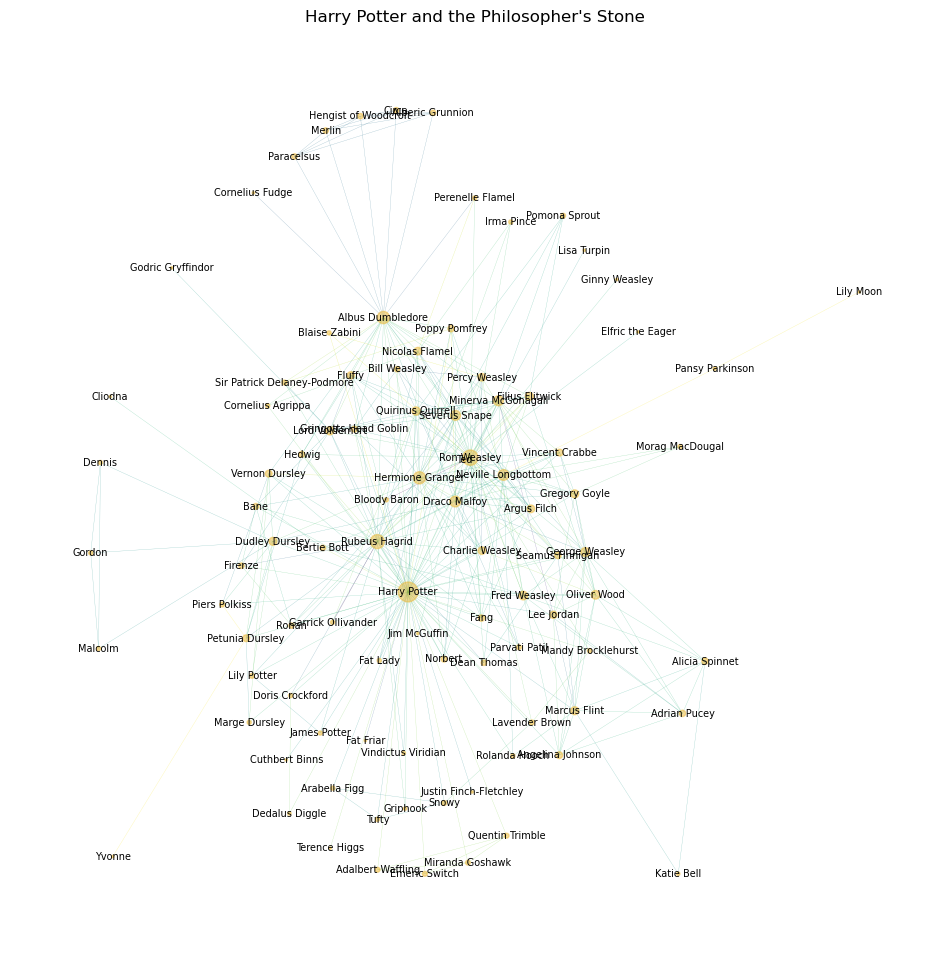

Graph with 77 nodes and 342 edges


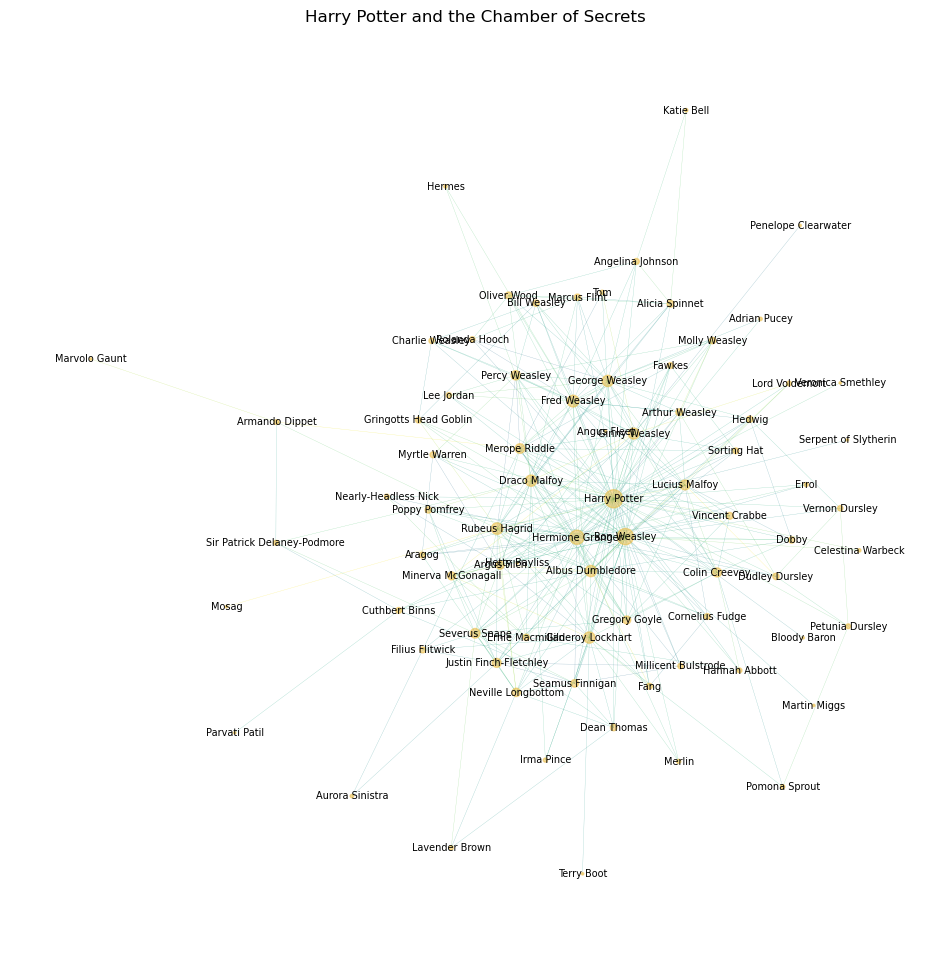

Graph with 87 nodes and 420 edges


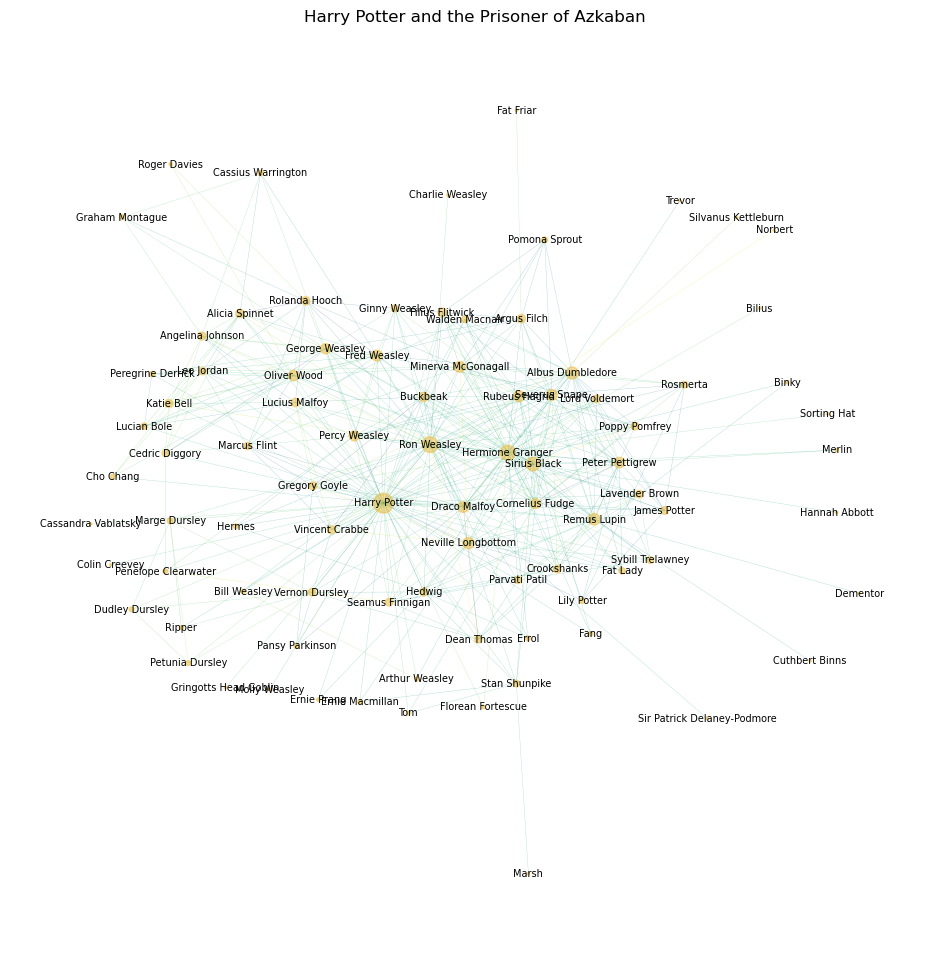

Graph with 151 nodes and 727 edges


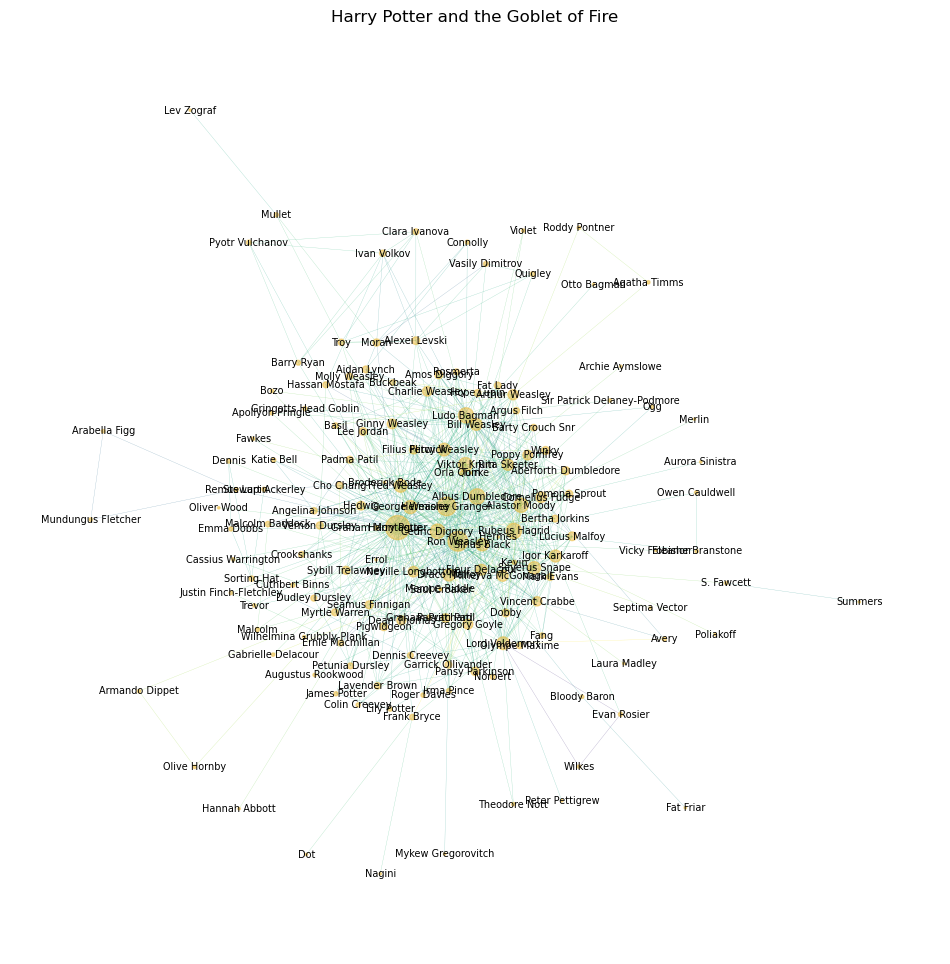

Graph with 192 nodes and 1292 edges


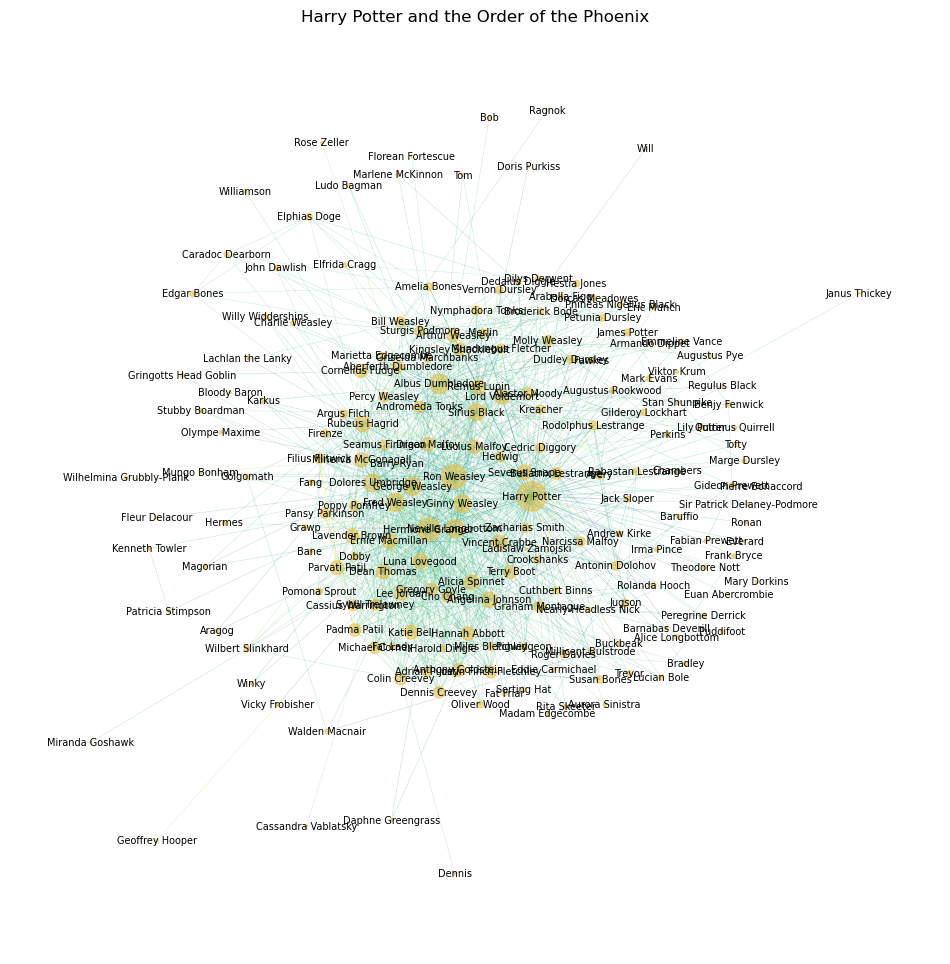

Graph with 169 nodes and 830 edges


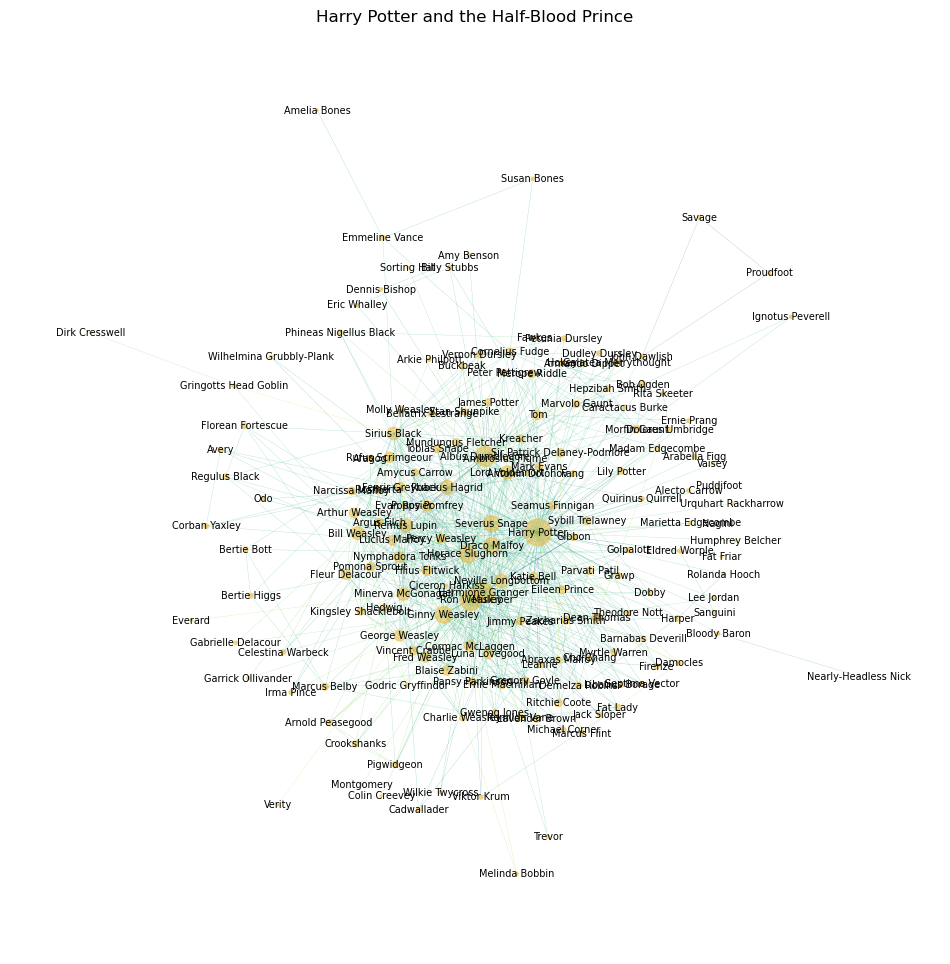

Graph with 177 nodes and 959 edges


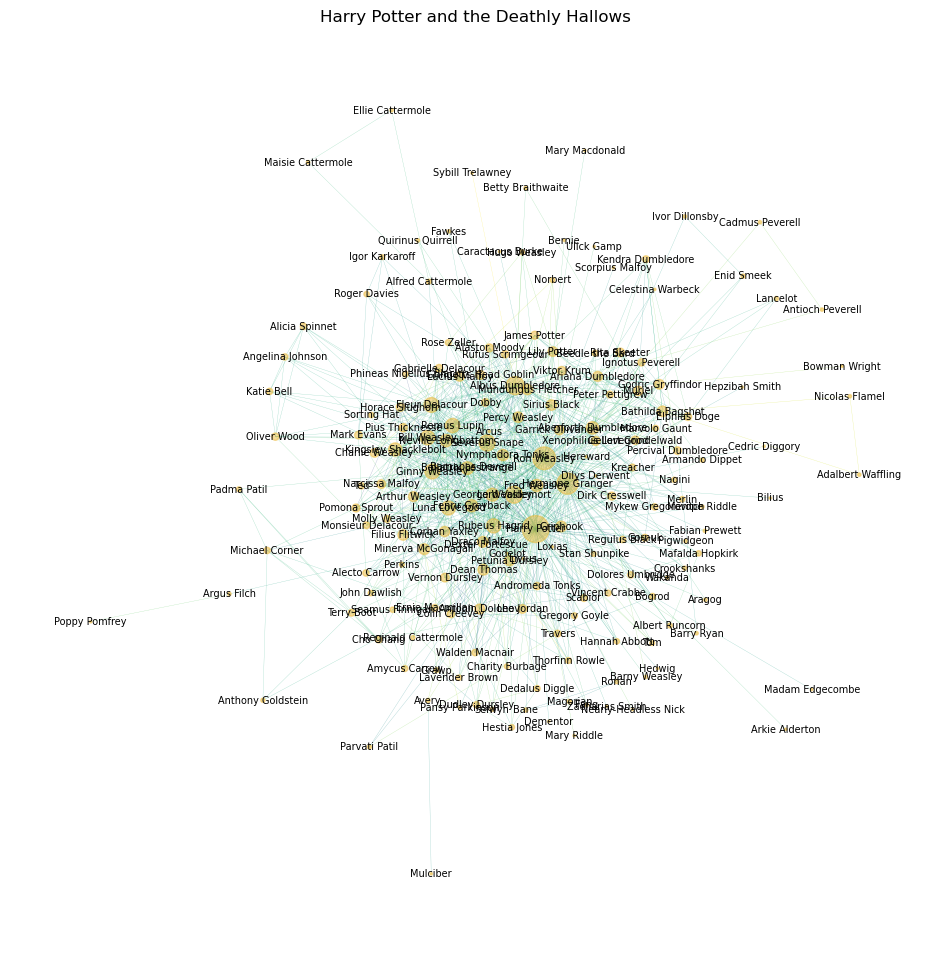

In [26]:
# Read the characters list that we scrapped from fandom
characters_df = pd.read_csv('characters_fandom.csv')

book_titles = [
    "Harry Potter and the Philosopher's Stone",
    "Harry Potter and the Chamber of Secrets",
    "Harry Potter and the Prisoner of Azkaban",
    "Harry Potter and the Goblet of Fire",
    "Harry Potter and the Order of the Phoenix",
    "Harry Potter and the Half-Blood Prince",
    "Harry Potter and the Deathly Hallows"
]

# Create empty lists to store results
graphs = []   # store the graphs that are created
entities_dfs = []   # store the sentences and the entities that are identified in them, in a dataframe, for each book

for i, book in enumerate(books_list):
    # Find entities for the current book
    sent_entity_df = find_entities(book, characters_df)
    entities_dfs.append(sent_entity_df)

    # Find relationships for the current book based on the sentences that contain the entities
    relationships_df = find_relationships(sent_entity_df)
    
    # Sort the source and target for each row
    relationships_df[['source', 'target']] = np.sort(relationships_df[['source', 'target']], axis=1)

    # Group by the sorted source and target, and join sentences
    aggregated_df = relationships_df.groupby(['source', 'target'])['sentence'].apply(' '.join).reset_index()

    # Build a network for the current book bsaed on the relationships that were identified
    G = build_network(aggregated_df, book_titles[i])
    graphs.append(G)

In [27]:
# Save the information of sentence-entity in each book - we need this code when we do sentiment analysis by character
ent_books_dir = 'Sent_ent_per_book'

# Create the directory if it doesn't exist
if not os.path.exists(ent_books_dir):
    os.makedirs(ent_books_dir)
    
for index, entity_df in enumerate(entities_dfs):
    output_file = os.path.join(ent_books_dir, f"sent_ent_{index+1}.csv")
    entity_df.to_csv(output_file, index=False) 

-----------------

# 4. Analyzing the networks

In this part we wanted to analyze the size of the networks and see if and how they progress over time. We also wanted to examine, through node decrees and centralities, if the protagonists of the books are indeed the most connected nodes or if our analysis reveals something new/different. 

## Size of networks

To visualize the changes in the number of nodes and edges across the seven networks, we created a line graph.

In [28]:
book_short_titles = [
    "Philosopher's Stone", "Chamber of Secrets", "Prisoner of Azkaban",
    "Goblet of Fire", "Order of the Phoenix", "Half-Blood Prince",
    "Deathly Hallows"]

# Create an empty DataFrame to store book name, nodes and edges of each network
networks_info_df = pd.DataFrame(columns=["book", "nodes", "edges"])

# Iterate through the graphs
for i, (graph, name) in enumerate(zip(graphs, book_short_titles)):
    # Extract the nodes and edges from the graph
    nodes = len(graph.nodes())
    edges = len(graph.edges())
    
    # Add the book name, nodes and edges to networks_info_df
    networks_info_df.loc[i] = [name, nodes, edges]

C:\Users\frena\AppData\Local\Temp\ipykernel_25284\4021895669.py:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax1.set_xticklabels(networks_info_df['book'], rotation=45, ha='right')


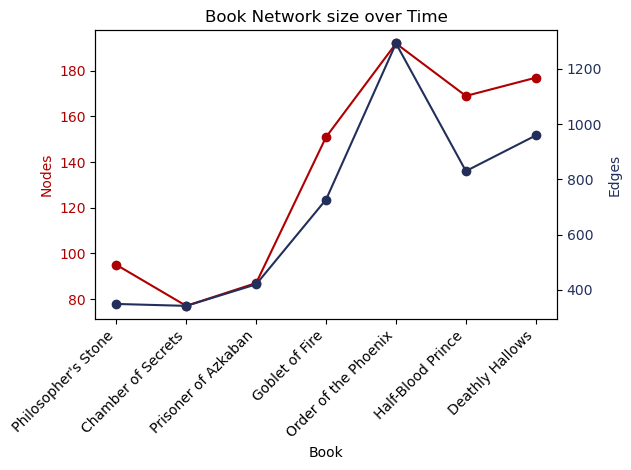

In [29]:
# Create a new figure and a twin Axes sharing the xaxis
fig, ax1 = plt.subplots()

# Set the title of the graph
plt.title('Book Network size over Time')

# Plot the "Nodes" data
color = '#ae0001'
ax1.set_xlabel('Book')
ax1.set_ylabel('Nodes', color=color)
ax1.plot(networks_info_df['book'], networks_info_df['nodes'], color=color, marker='o')
ax1.tick_params(axis='y', labelcolor=color)
ax1.set_xticklabels(networks_info_df['book'], rotation=45, ha='right')

# Create a twin Axes sharing the xaxis to plot the "Edges" data
ax2 = ax1.twinx()  
color = '#222f5b'
ax2.set_ylabel('Edges', color=color)
ax2.plot(networks_info_df['book'], networks_info_df['edges'], color=color, marker='o')
ax2.tick_params(axis='y', labelcolor=color)

# Show the graph with a tight layout to fit the rotated x-axis labels
plt.tight_layout()
plt.show()

In the first three books, the networks exhibit relatively smaller sizes, reflecting the fact that the story mainly takes place  at Hogwarts, and there aren't many new characters introduced. But in the fourth book, "Goblet of Fire," things change. The Triwizard Tournament brings in alot of new characters, making the network bigger. This shows how these characters are now connected and interacting more. As the series goes on, the networks keep getting larger. The story goes beyond Hogwarts, bringing in lots of new characters like the members of the Order of the Phoenix and Death Eaters. This makes the networks more complex as the story expands outside the familiar school setting.

## Degree Distribution of networks

We calculated and plotted the degree distribution of the nodes in a Linear Scale and a Log-Log Scale.

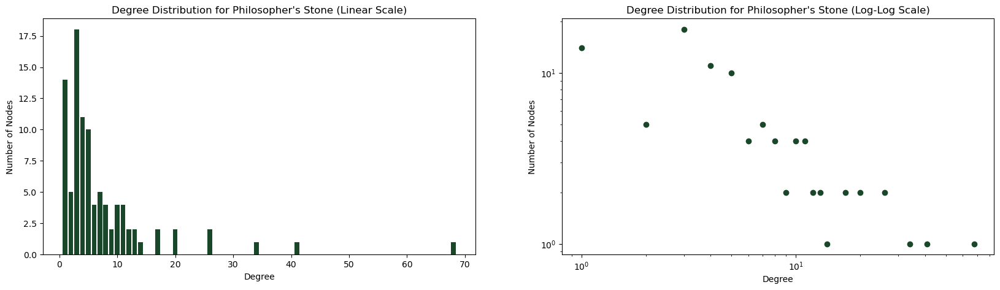

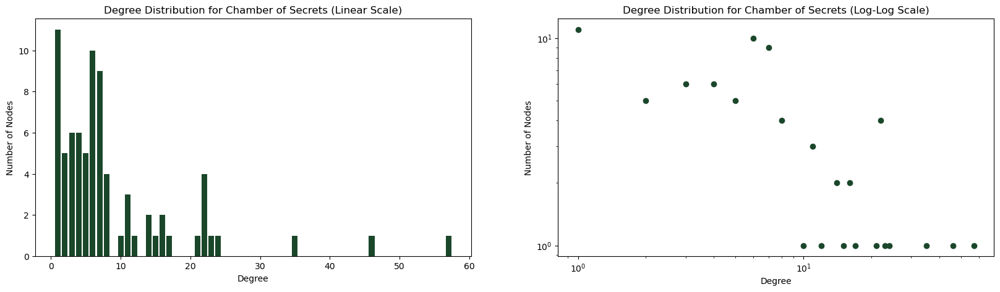

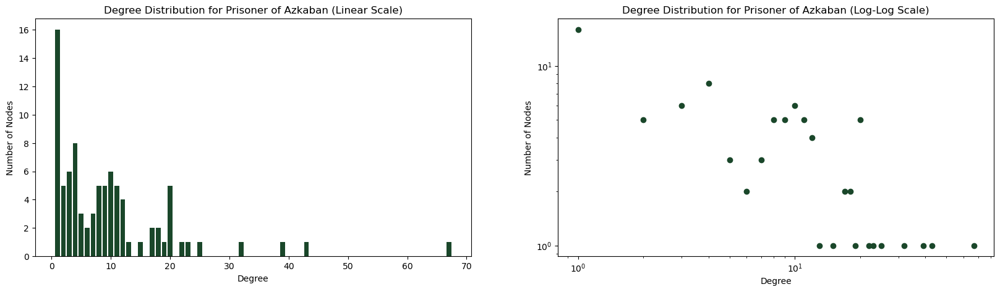

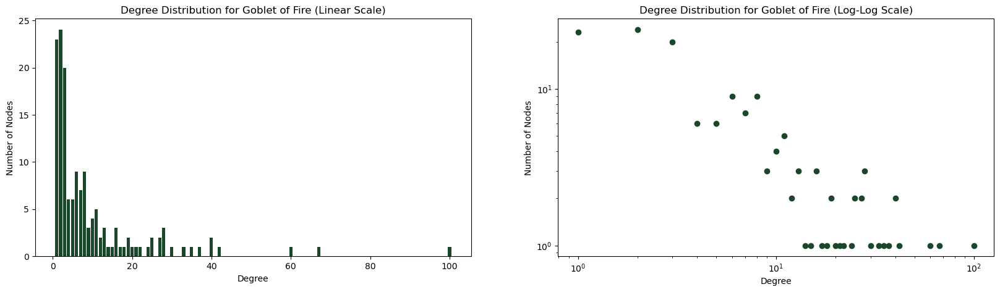

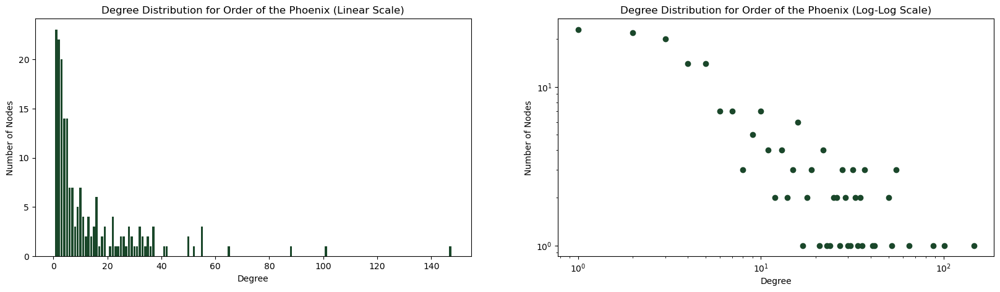

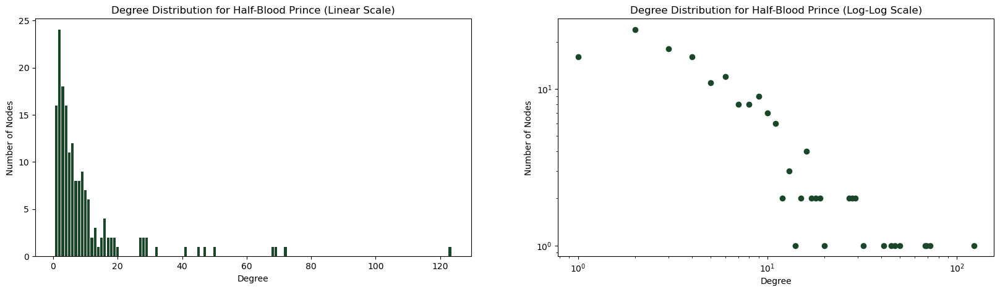

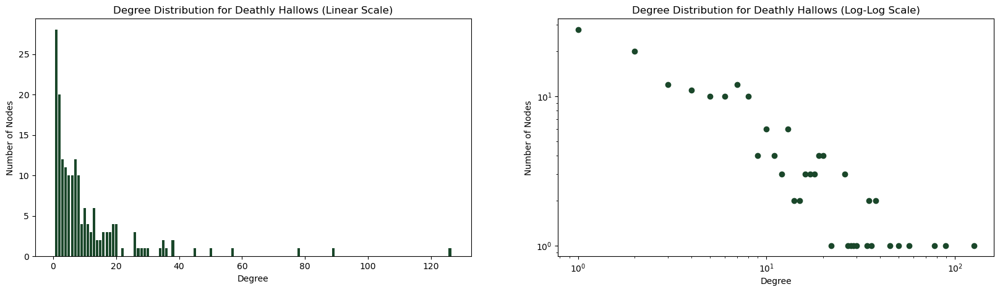

In [30]:
for graph, title in zip(graphs, book_short_titles):
    degrees = dict(graph.degree())
    degree_counts = {}

    for degree in degrees.values():
        degree_counts[degree] = degree_counts.get(degree, 0) + 1

    degree_values, degree_counts = zip(*sorted(degree_counts.items()))

    plt.figure(figsize=(20, 5))  # Adjusted figure size

    # Linear plot
    plt.subplot(1, 2, 1) 
    plt.bar(degree_values, degree_counts, color='#1a472a', align='center')
    plt.title(f"Degree Distribution for {title} (Linear Scale)")
    plt.xlabel("Degree")
    plt.ylabel("Number of Nodes")

    # Log-log plot 
    plt.subplot(1, 2, 2)  
    plt.scatter(degree_values, degree_counts, color='#1a472a') 
    plt.title(f"Degree Distribution for {title} (Log-Log Scale)")
    plt.xlabel("Degree")
    plt.ylabel("Number of Nodes")
    plt.xscale('log')
    plt.yscale('log')

    plt.show()

When observing the degree distribution plots, we can make the following observations about the networks' structure and behavior.
The distributions exhibit a long-tail pattern consistent of a scale free network, where most nodes have relatively low degrees, and a small number of nodes have exceptionally high degrees. We can identify nodes that are particularly popular within the network which are probably the protagonists that interact with a lot of other characters as they appear in most of the scenes. The majority of nodes have few connections as a lot of the characters have a smaller role in the series.

## Most Connected Nodes

 We calculated the degrees of the nodes and printed the Top 20 nodes by degree.

In [31]:
# Calculate and print the Top nodes by degree for each book's graph
centrals_per_book = []
for graph, title in zip(graphs, book_short_titles):
    # Calculate degree of each node
    degrees = dict(graph.degree())

    # Sort nodes by degree in descending order
    sorted_degrees = sorted(degrees.items(), key=lambda item: item[1], reverse=True)

    # Print the first 20 nodes with the highest degree
    print(f"\nTop 20 nodes by degree in {title}:")
    for node, degree in sorted_degrees[:20]:
        print(f"{node}: {degree}")
    
    centrals_per_book.append(sorted_degrees[:20])
    
with open('data_central_characters.json', 'w') as file:
    json.dump(centrals_per_book, file)


Top 20 nodes by degree in Philosopher's Stone:
Harry Potter: 68
Ron Weasley: 41
Rubeus Hagrid: 34
Albus Dumbledore: 26
Hermione Granger: 26
Draco Malfoy: 20
Neville Longbottom: 20
Minerva McGonagall: 17
Severus Snape: 17
George Weasley: 14
Fred Weasley: 13
Oliver Wood: 13
Lord Voldemort: 12
Quirinus Quirrell: 12
Marcus Flint: 11
Filius Flitwick: 11
Dudley Dursley: 11
Gregory Goyle: 11
Nicolas Flamel: 10
Percy Weasley: 10

Top 20 nodes by degree in Chamber of Secrets:
Harry Potter: 57
Ron Weasley: 46
Hermione Granger: 35
Fred Weasley: 24
Rubeus Hagrid: 23
George Weasley: 22
Albus Dumbledore: 22
Draco Malfoy: 22
Gilderoy Lockhart: 22
Ginny Weasley: 21
Lucius Malfoy: 17
Merope Riddle: 16
Severus Snape: 16
Percy Weasley: 15
Colin Creevey: 14
Justin Finch-Fletchley: 14
Neville Longbottom: 12
Argus Filch: 11
Gregory Goyle: 11
Minerva McGonagall: 11

Top 20 nodes by degree in Prisoner of Azkaban:
Harry Potter: 67
Ron Weasley: 43
Hermione Granger: 39
Sirius Black: 32
Albus Dumbledore: 25
Remu

By looking at the characters that appear in the top 20 characters lists of all the books, we can spot 6 that appear in all of them. These are the 3 main friends and protagonists Harry Potter, Ron Weasley and Hermione Granger, Professor Albus Dumbledore as well as Professor Severus Snape who plays a critical role at the series. We also find Rubeus Hagrid that helped the trio in their adventures. The presense of George Weasley can be consider as a small suprise since he doesn't play a central role in a lot of the happenings throughout the books but it seems that he interacted with a lot of the characters in all of the books.

## Centralities

We also calculated the degree centrality of the nodes to quantify the importance of the nodes by assessing the number of connections (edges) they have with other nodes in the network.

In [32]:
for graph, title in zip(graphs, book_short_titles):
    # Calculate degree centrality for each node
    degree_centrality = nx.degree_centrality(graph)

    # Sort nodes by degree centrality in descending order
    sorted_degrees_centrality = sorted(degree_centrality.items(), key=lambda item: item[1], reverse=True)

    # Print the first 20 nodes with the highest degree centrality
    print(f"\nTop 20 nodes by degree centrality in {title}:")
    for node, centrality in sorted_degrees_centrality[:20]:
        print(f"{node}: {centrality:.4f}")


Top 20 nodes by degree centrality in Philosopher's Stone:
Harry Potter: 0.7234
Ron Weasley: 0.4362
Rubeus Hagrid: 0.3617
Albus Dumbledore: 0.2766
Hermione Granger: 0.2766
Draco Malfoy: 0.2128
Neville Longbottom: 0.2128
Minerva McGonagall: 0.1809
Severus Snape: 0.1809
George Weasley: 0.1489
Fred Weasley: 0.1383
Oliver Wood: 0.1383
Lord Voldemort: 0.1277
Quirinus Quirrell: 0.1277
Marcus Flint: 0.1170
Filius Flitwick: 0.1170
Dudley Dursley: 0.1170
Gregory Goyle: 0.1170
Nicolas Flamel: 0.1064
Percy Weasley: 0.1064

Top 20 nodes by degree centrality in Chamber of Secrets:
Harry Potter: 0.7500
Ron Weasley: 0.6053
Hermione Granger: 0.4605
Fred Weasley: 0.3158
Rubeus Hagrid: 0.3026
George Weasley: 0.2895
Albus Dumbledore: 0.2895
Draco Malfoy: 0.2895
Gilderoy Lockhart: 0.2895
Ginny Weasley: 0.2763
Lucius Malfoy: 0.2237
Merope Riddle: 0.2105
Severus Snape: 0.2105
Percy Weasley: 0.1974
Colin Creevey: 0.1842
Justin Finch-Fletchley: 0.1842
Neville Longbottom: 0.1579
Argus Filch: 0.1447
Gregory Goy

We also computed the eigenvector centrality of the nodes. Eigenvector centrality reflects the idea that a node is influential if it is connected to other nodes that, in turn, have high centrality in the network

In [33]:
for graph, title in zip(graphs, book_short_titles):
    # Calculate eigenvector centrality for each node
    eigenvector_centrality = nx.eigenvector_centrality(graph)

    # Sort nodes by eigenvector centrality in descending order
    sorted_eigenvector_centrality = sorted(eigenvector_centrality.items(), key=lambda item: item[1], reverse=True)

    # Print the first 20 nodes with the highest eigenvector centrality
    print(f"\nTop 20 nodes by eigenvector centrality in {title}:")
    for node, centrality in sorted_eigenvector_centrality[:20]:
        print(f"{node}: {centrality:.4f}")


Top 20 nodes by eigenvector centrality in Philosopher's Stone:
Harry Potter: 0.3939
Ron Weasley: 0.3156
Rubeus Hagrid: 0.2741
Hermione Granger: 0.2440
Draco Malfoy: 0.2132
Albus Dumbledore: 0.2094
Minerva McGonagall: 0.1986
Neville Longbottom: 0.1956
Severus Snape: 0.1928
Filius Flitwick: 0.1469
Argus Filch: 0.1446
Quirinus Quirrell: 0.1413
Gregory Goyle: 0.1314
Lord Voldemort: 0.1310
George Weasley: 0.1298
Fred Weasley: 0.1285
Fluffy: 0.1272
Charlie Weasley: 0.1230
Nicolas Flamel: 0.1218
Oliver Wood: 0.1200

Top 20 nodes by eigenvector centrality in Chamber of Secrets:
Harry Potter: 0.3535
Ron Weasley: 0.3231
Hermione Granger: 0.2842
Rubeus Hagrid: 0.2090
Albus Dumbledore: 0.2066
Draco Malfoy: 0.2051
Fred Weasley: 0.2008
Ginny Weasley: 0.1945
Gilderoy Lockhart: 0.1928
George Weasley: 0.1877
Lucius Malfoy: 0.1760
Merope Riddle: 0.1569
Severus Snape: 0.1539
Colin Creevey: 0.1506
Percy Weasley: 0.1485
Gregory Goyle: 0.1382
Justin Finch-Fletchley: 0.1379
Minerva McGonagall: 0.1278
Argus 

We calculated betweenness centrality to see which are the nodes with high betweenness centrality that have a significant influence on the interactions between other nodes.

In [34]:
for graph, title in zip(graphs, book_short_titles):
    # Calculate betweenness centrality for each node
    betweenness_centrality = nx.betweenness_centrality(graph)

    # Sort nodes by betweenness centrality in descending order
    sorted_betweenness_centrality = sorted(betweenness_centrality.items(), key=lambda item: item[1], reverse=True)

    # Print the first 20 nodes with the highest betweenness centrality
    print(f"\nTop 20 nodes by betweenness centrality in {title}:")
    for node, centrality in sorted_betweenness_centrality[:20]:
        print(f"{node}: {centrality:.4f}")



Top 20 nodes by betweenness centrality in Philosopher's Stone:
Harry Potter: 0.5098
Ron Weasley: 0.1462
Albus Dumbledore: 0.1338
Rubeus Hagrid: 0.0767
Dudley Dursley: 0.0637
Neville Longbottom: 0.0603
Hermione Granger: 0.0256
Lord Voldemort: 0.0242
Marcus Flint: 0.0240
Petunia Dursley: 0.0218
Bertie Bott: 0.0208
Pansy Parkinson: 0.0208
Draco Malfoy: 0.0202
Fred Weasley: 0.0169
George Weasley: 0.0119
Severus Snape: 0.0118
Minerva McGonagall: 0.0113
Oliver Wood: 0.0106
Nicolas Flamel: 0.0065
Filius Flitwick: 0.0058

Top 20 nodes by betweenness centrality in Chamber of Secrets:
Harry Potter: 0.3543
Ron Weasley: 0.1679
Hermione Granger: 0.0656
Rubeus Hagrid: 0.0647
Gilderoy Lockhart: 0.0566
Fred Weasley: 0.0424
Ginny Weasley: 0.0395
Draco Malfoy: 0.0341
Cuthbert Binns: 0.0286
Merope Riddle: 0.0268
Armando Dippet: 0.0265
George Weasley: 0.0244
Severus Snape: 0.0220
Justin Finch-Fletchley: 0.0206
Albus Dumbledore: 0.0198
Percy Weasley: 0.0151
Angelina Johnson: 0.0133
Alicia Spinnet: 0.0130


All the different ways of calculating the centralities result in similar characters lists.

---------------------------------------------------------------------------------------------------------------------------

# 5. Sentiment Analysis

In order to understand the results of the networks more thoroughly, we examined some prominent pairs of characters and printed their sentiment values in a table. 

In [35]:
# Specify importnant character couples
character_couples = [
    ('Harry Potter', 'Hermione Granger'),
    ('Harry Potter', 'Ron Weasley'),
    ('Hermione Granger', 'Ron Weasley'),
    ('Draco Malfoy', 'Ron Weasley'),
    ('Harry Potter', 'Lord Voldemort'),
    ('Harry Potter', 'Rubeus Hagrid'),
    ('Albus Dumbledore', 'Minerva McGonagall'),
    ('Albus Dumbledore', 'Severus Snape')
]

# Create an empty DataFrame for the final table
table_data = []

# Iterate over character couples
for couple in character_couples:
    couple_sentiments = []
    for df in sentiment_dfs:
        for index, row in df.iterrows():
            if (row['source'] == couple[0] and row['target'] == couple[1]):
                couple_sentiments.append(row['sentiment'])
    table_data.append([f'{couple[0]} - {couple[1]}'] + couple_sentiments)
    
# Create the final DataFrame
columns = ['Couple'] + [f'Book {book_num}' for book_num in range(1, len(sentiment_dfs) + 1)]
table_df = pd.DataFrame(table_data, columns=columns)

# Display the table
table_df


,Couple,Book 1,Book 2,Book 3,Book 4,Book 5,Book 6,Book 7
0,Harry Potter - Hermione Granger,5.304617,5.290217,5.296287,5.309499,5.317433,5.321088,5.252946
1,Harry Potter - Ron Weasley,5.324008,5.293698,5.282727,5.313431,5.295629,5.310020,5.256729
2,Hermione Granger - Ron Weasley,5.286474,5.262610,5.272791,5.321687,5.295491,5.309458,5.243725
3,Draco Malfoy - Ron Weasley,5.318511,5.307553,5.328837,5.357805,5.384626,5.341586,5.127974
4,Harry Potter - Lord Voldemort,5.112972,5.259908,5.269448,5.218844,5.281680,5.260552,5.235836
5,Harry Potter - Rubeus Hagrid,5.300481,5.262121,5.267441,5.326789,5.300931,5.280681,5.217647
6,Albus Dumbledore - Minerva McGonagall,5.343368,5.550345,5.184651,5.383855,5.323475,5.496000,NaN
7,Albus Dumbledore - Severus Snape,5.365714,5.449130,5.300051,5.369363,5.304359,5.266156,5.292765


(Note: Albus Dumbledore dies in the 6th book so any of his interactions that may appear for Book 7 will be limited.)

What we observe:
- There is a lack of wide variation in sentiment scores while the values generally revolve around 5.5.
- Main character pairs maintain consistent sentiment values across books, such as Harry Potter with his friends, Hermione and Ron.
- The sentiment between Harry Potter and Voldemort is not negative besides the fact that they are the main adversaries of the series.
- The sentiment between Ron and Malfoy is pretty similar to that of Ron and Hermione which does not showcase that the former are rivals and the latter are friends.

Answering our research question:

Unfortunately we are not able to draw any conclusions on the nature of the relationships between the characters - if they are friends or enemies - as there is no clear distinction in the sentiment values that appear in our network. For example, Hermione and Ron get married in the last book but their sentiment is lower than in any other book. Moreover, Harry Potter displays a sentiment of 5.4 with Voldemort in most of the books, while he displays the same sentiment with his friends throughout the series. Another example, is that Harry Potter and Ron - friends in the whole series - have a lower sentiment than Ron and Malfoy - considered enemies since Drako Malfoy bullys Ron a lot, especially during the first books - for most of the books.

Conclusions on why this is happening and potential extensions to reveal the type of relationships we are looking for:
- Because of the nature of books a lot of the text that the names appear in, is plain descriptive text that does not express any emotion. Also, in a book there are many parts where a third person may describe the sentiment of another character. A potential solution could be to extract only the parts of the books where the characters interact with each other in the form of dialog. However, this might not be feasible since many different parts of the book might display emotion and also it would be very hard to find out which character said what as this is not explicitely mentioned (as it would be in a movie script).
- Our network seems to emphasize on character interactions rather than explicitly describing the relationships between characters. So, we might need to completely change the way we create our network. 
- While sentiment scores provide insights, a deeper analysis of context and specific narrative instances could offer a richer understanding of character relationships. One solution of this could be to use a more complex way of calculating the sentiment, taking into consideration the context of the words as well as punctuation marks.

To further explore the books, we decided to conduct sentiment analysis to find out about the progress of the sentiment throughout the Harry Potter series.

## Reading books and splitting chapters

First, we are going through some preprocessing steps in order to get the books and split them into chapters.

In [36]:
# Get the books

def read_books_from_folder(folder_path):
    # List to hold the content of each book
    books_content = []

    # Loop through each file in the folder
    for filename in os.listdir(folder_path):
        # Construct the full file path
        file_path = os.path.join(folder_path, filename)

        # Check if it's a file and not a directory
        if os.path.isfile(file_path):
            # Read the file and append its content to the list
            with open(file_path, 'r', encoding='utf-8') as file:
                books_content.append(file.read())

    return books_content

# Read the clean books and add their text to a list
folder_path = 'Books_cleaned'  # Replace with your folder path
books_list = read_books_from_folder(folder_path)

book1 = books_list[0]
book2 = books_list[1]
book3 = books_list[2]
book4 = books_list[3]
book5 = books_list[4]
book6 = books_list[5]
book7 = books_list[6]

In [37]:
# Harry Potter Series Chapters
harry_potter_chapters = [
    # Book 1: Harry Potter and the Philosopher's Stone
    ["THE BOY WHO LIVED", "THE VANISHING GLASS", "THE LETTERS FROM NO ONE", "THE KEEPER OF KEYS", "DIAGON ALLEY", 
     "THE JOURNEY FROM PLATFORM NINE AND THREE-QUARTERS", "THE SORTING HAT", "THE POTIONS MASTER", "THE MIDNIGHT DUEL", 
     "HALLOWE'EN", "QUIDDITCH", "THE MIRROR OF ERISED", "NICOLAS FLAMEL", "NORBERT THE NORWEGIAN RIDGEBACK", 
     "THE FORBIDDEN FOREST", "THROUGH THE TRAPDOOR", "THE MAN WITH TWO FACES"],

    # Book 2: Harry Potter and the Chamber of Secrets
    ["THE WORST BIRTHDAY", "DOBBY'S WARNING", "THE BURROW", "AT FLOURISH AND BLOTTS", "THE WHOMPING WILLOW", 
     "GILDEROY LOCKHART", "MUDBLOODS AND MURMURS", "THE DEATHDAY PARTY", "THE WRITING ON THE WALL", 
     "THE ROGUE BLUDGER", "THE DUELING CLUB", "THE POLYJUICE POTION", "THE VERY SECRET DIARY", "CORNELIUS FUDGE", 
     "ARAGOG", "THE CHAMBER OF SECRETS", "THE HEIR OF SLYTHERIN", "DOBBY'S REWARD"],

    # Book 3: Harry Potter and the Prisoner of Azkaban
    ["OWL POST", "AUNT MARGE'S BIG MISTAKE", "THE KNIGHT BUS", "THE LEAKY CAULDRON", "THE DEMENTOR", "TALONS AND TEA LEAVES",
     "THE BOGGART IN THE WARDROBE", "FLIGHT OF THE FAT LADY", "GRIM DEFEAT", "THE MARAUDER'S MAP", "THE FIREBOLT", 
     "THE PATRONUS", "GRYFFINDOR VERSUS RAVENCLAW", "SNAPE'S GRUDGE", "THE QUIDDITCH FINAL", "PROFESSOR TRELAWNEY'S PREDICTION",
     "CAT, RAT, AND DOG", "MOONY, WORMTAIL, PADFOOT, AND PRONGS", "THE SERVANT OF LORD VOLDEMORT", "THE DEMENTOR'S KISS",
     "HERMIONE'S SECRET", "OWL POST AGAIN"],

    # Book 4: Harry Potter and the Goblet of Fire
    ["THE RIDDLE HOUSE", "THE SCAR", "THE INVITATION", "BACK TO THE BURROW", "WEASLEY'S WIZARD WHEEZES", "THE PORTKEY", 
     "BAGMAN AND CROUCH", "THE QUIDDITCH WORLD CUP", "THE DARK MARK", "MAYHEM AT THE MINISTRY", "ABOARD THE HOGWARTS EXPRESS", 
     "THE TRIWIZARD TOURNAMENT", "MAD-EYE MOODY", "THE UNFORGIVABLE CURSES", "BEAUXBATONS AND DURMSTRANG", "THE GOBLET OF FIRE", 
     "THE FOUR CHAMPIONS", "THE WEIGHING OF THE WANDS", "THE HUNGARIAN HORNTAIL", "THE FIRST TASK", "THE HOUSE-ELF LIBERATION FRONT", 
     "THE UNEXPECTED TASK", "THE YULE BALL", "RITA SKEETER'S SCOOP", "THE EGG AND THE EYE", "THE SECOND TASK", "PADFOOT RETURNS", 
     "THE MADNESS OF MR CROUCH", "THE DREAM", "THE PENSIEVE", "THE THIRD TASK", "FLESH, BLOOD, AND BONE", "THE DEATH EATERS", 
     "PRIORI INCANTATEM", "VERITASERUM", "THE PARTING OF THE WAYS", "THE BEGINNING"],

    # Book 5: Harry Potter and the Order of the Phoenix
    ["DUDLEY DEMENTED", "A PECK OF OWLS", "THE ADVANCE GUARD", "NUMBER TWELVE, GRIMMAULD PLACE", "THE ORDER OF THE PHOENIX", 
     "THE NOBLE AND MOST ANCIENT HOUSE OF BLACK", "THE MINISTRY OF MAGIC", "THE HEARING", "THE WOES OF MRS WEASLEY", 
     "LUNA LOVEGOOD", "THE SORTING HAT'S NEW SONG", "PROFESSOR UMBRIDGE", "DETOURS AND DILEMMAS", "PERCY AND PADFOOT", 
     "THE HOGWARTS HIGH INQUISITOR", "IN THE HOG'S HEAD", "EDUCATIONAL DECREE NUMBER TWENTY-FOUR", "DUMBLEDORE'S ARMY", 
     "THE LION AND THE SERPENT", "HAGRID'S TALE", "THE EYE OF THE SNAKE", "ST MUNGO'S HOSPITAL FOR MAGICAL MALADIES AND INJURIES", 
     "CHRISTMAS ON THE CLOSED WARD", "OCCLUMENCY", "THE BEETLE AT BAY", "SEEN AND UNFORESEEN", "THE CENTAUR AND THE SNEAK", 
     "SNAPES WORST MEMORY", "CAREERS ADVICE", "GOSSAMER", "BEYOND THE VEIL", "THE ONLY ONE HE EVER FEARED", 
     "THE LOST PROPHECY", "THE SECOND WAR BEGINS"],

    # Book 6: Harry Potter and the Half-Blood Prince
    ["THE OTHER MINISTER", "SPINNER'S END", "WILL AND WON'T", "HORACE SLUGHORN", "AN EXCESS OF PHLEGM", "DRACO'S DETOUR", 
     "THE SLUG CLUB", "SNAPES VICTORY", "THE HALF-BLOOD PRINCE", "THE HOUSE OF GAUNT", "HERMIONE'S HELPING HAND", "SILVER AND OPALS", 
     "THE SECRET RIDDLE", "FELIX FELICIS", "THE UNBREAKABLE VOW", "A VERY FROSTY CHRISTMAS", "A SLUGGISH MEMORY", 
     "BIRTHDAY SURPRISES", "ELF TAILS", "LORD VOLDEMORTS REQUEST", "THE UNKNOWABLE ROOM", "AFTER THE BURIAL", "HORCRUXES", 
     "SECTUMSEMPRA", "THE SEER OVERHEARD", "THE CAVE", "THE LIGHTNING-STRUCK TOWER", "FLIGHT OF THE PRINCE", "THE PHOENIX LAMENT", 
     "THE WHITE TOMB"],

    # Book 7: Harry Potter and the Deathly Hallows
    ["THE DARK LORD ASCENDING", "IN MEMORIAM", "THE DURSLEYS DEPARTING", "THE SEVEN POTTERS", "FALLEN WARRIOR", 
     "THE GHUL IN PYJAMAS", "THE WILL OF ALBUS DUMBLEDORE", "THE WEDDING", "A PLACE TO HIDE", "KREACHER'S TALE", 
     "THE BRIBE", "MAGIC IS MIGHT", "THE MUGGLE-BORN REGISTRATION COMMISSION", "THE THIEF", "THE GOBLIN'S REVENGE", 
     "GODRIC'S HOLLOW", "BATHILDA'S SECRET", "THE LIFE AND LIES OF ALBUS DUMBLEDORE", "THE SILVER DOE", "XENOPHILIUS LOVEGOOD", 
     "THE TALE OF THE THREE BROTHERS", "THE DEATHLY HALLOWS", "MALFOY MANOR", "THE WANDMAKER", "SHELL COTTAGE", "GRINGOTTS", 
     "THE FINAL HIDING PLACE", "THE MISSING MIRROR", "THE LOST DIADEM", "THE SACKING OF SEVERUS SNAPE", "THE BATTLE OF HOGWARTS", 
     "THE ELDER WAND", "THE PRINCE'S TALE", "THE FOREST AGAIN", "KING'S CROSS", "THE FLAW IN THE PLAN"]
]

In [38]:
# Based on the chapters titles split the books in chapters
def split_into_chapters(book_text, chapter_titles):
    chapters = []
    start = 0

    # Iterate through the list of chapter titles
    for i in range(len(chapter_titles)):
        # Find the starting index of the current chapter
        # Add len(title) to start from the end of the title
        start = book_text.find(chapter_titles[i], start) + len(chapter_titles[i])

        # Find the starting index of the next chapter, if it exists
        end = None
        if i < len(chapter_titles) - 1:
            end = book_text.find(chapter_titles[i + 1], start)

        # Extract the chapter text
        chapter_text = book_text[start:end].strip()
        chapters.append(chapter_text)

        # Update start index for next iteration
        start = end if end else start

    return chapters

chapters1 = split_into_chapters(book1, harry_potter_chapters[0])
chapters2 = split_into_chapters(book2, harry_potter_chapters[1])
chapters3 = split_into_chapters(book3, harry_potter_chapters[2])
chapters4 = split_into_chapters(book4, harry_potter_chapters[3])
chapters5 = split_into_chapters(book5, harry_potter_chapters[4])
chapters6 = split_into_chapters(book6, harry_potter_chapters[5])
chapters7 = split_into_chapters(book7, harry_potter_chapters[6])

chapters_list = [chapters1, chapters2, chapters3, chapters4, chapters5, chapters6, chapters7]

## Sentiment per Book

In [39]:
# Calculate each book's sentiment

sent_book1 = calculate_sentiment(book1, labmt) #processed_books[0]
sent_book2 = calculate_sentiment(book2, labmt)
sent_book3 = calculate_sentiment(book3, labmt)
sent_book4 = calculate_sentiment(book4, labmt)
sent_book5 = calculate_sentiment(book5, labmt)
sent_book6 = calculate_sentiment(book6, labmt)
sent_book7 = calculate_sentiment(book7, labmt)

sentiment_of_books = [sent_book1, sent_book2, sent_book3, sent_book4, sent_book5, sent_book6, sent_book7]
sentiment_of_books

[5.331202475310488,
 5.317264584591944,
 5.317699770444448,
 5.327918639044576,
 5.323684228875256,
 5.325682345147389,
 5.293460516851781]

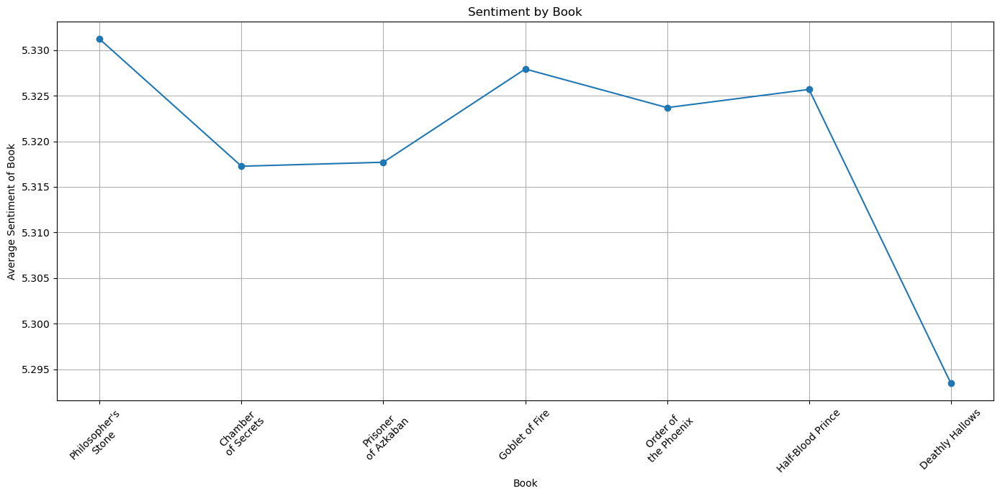

In [40]:
# Plot the sentiment of the book

book_titles = ["Philosopher's\nStone", "Chamber\nof Secrets", "Prisoner\nof Azkaban", "Goblet of Fire",
         "Order of\nthe Phoenix", "Half-Blood Prince", "Deathly Hallows"]

# Plotting the line chart
plt.figure(figsize=(14, 7))
plt.plot(book_titles, sentiment_of_books, marker='o')  # 'o' for circle markers
plt.title('Sentiment by Book')
plt.xlabel('Book')
plt.ylabel('Average Sentiment of Book')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjusts plot to ensure everything fits without overlapping

# Display the plot
plt.show()

The sentiment analysis graph of the books suggests that the Harry Potter series gets progressively darker, with the last book, "Deathly Hallows," having the lowest sentiment, reflecting its heavy themes. The last book is the peak of the fight against Voldemort that leads to significant character deaths and a final battle. The unexpected lower sentiment in "Chamber of Secrets" and "Prisoner of Azkaban" compared to "Goblet of Fire" and "Order of the Phoenix" might be due to the complex emotions and conflicts in these books, which affect sentiment but not necessarily the overall darkness.
In order to understand why this is happening we decided to explore the sentiment per chapter so that we get to better identify the events that influence the overall sentiment of each book.

## Sentiment per Chapter

In [41]:
# Calculate each chapter's sentiment

def calc_sent_for_chapter(chapters, labmt):
    sent_chapters = []
    for chapter in chapters:
        sent_chapters.append(calculate_sentiment(chapter, labmt))
    return sent_chapters

sent_chapters1 = calc_sent_for_chapter(chapters1, labmt) # processed_chapters[0]
sent_chapters2 = calc_sent_for_chapter(chapters2, labmt)
sent_chapters3 = calc_sent_for_chapter(chapters3, labmt)
sent_chapters4 = calc_sent_for_chapter(chapters4, labmt)
sent_chapters5 = calc_sent_for_chapter(chapters5, labmt)
sent_chapters6 = calc_sent_for_chapter(chapters6, labmt)
sent_chapters7 = calc_sent_for_chapter(chapters7, labmt)

sentiment_of_chapters = [sent_chapters1, sent_chapters2, sent_chapters3, sent_chapters4, sent_chapters5, sent_chapters6, sent_chapters7]

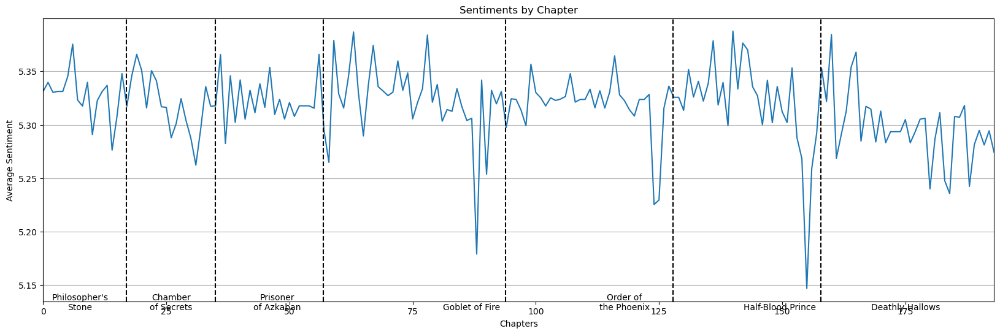

In [42]:
# Plot the sentiment for each chapter

# Concatenate all the sentiment scores into one list
all_sentiments = np.concatenate(sentiment_of_chapters)

# Calculate the starting index of each book in the concatenated list
book_indices = np.cumsum([0] + [len(book) for book in sentiment_of_chapters[:-1]])
# print(book_indices)

# Plot the sentiments in a sequence rather than in parallel
plt.figure(figsize=(20, 6))
plt.plot(all_sentiments)

count = 0
for start in book_indices[1:]:  # Skip the first index (0) as it is the start of the first book
    # Place vertical lines to indicate different books
    plt.axvline(x=start - 0.1, color='black', linestyle='--')
    # Adjust the labels for each book
    plt.text(start - (len(book_titles[count]) / 2), min(all_sentiments) - 0.02, book_titles[count], horizontalalignment='center')
    if count == 5:
        plt.text(175, min(all_sentiments) - 0.02, book_titles[count+1], horizontalalignment='center')
    count += 1

# Adjust the range of x-axis to the limits of chapters
plt.xlim(0, len(all_sentiments) - 1)

# Set the title and labels
plt.title('Sentiments by Chapter')
plt.xlabel('Chapters')
plt.ylabel('Average Sentiment')

# Set the y-axis to have a fixed range for better comparison
# plt.ylim(5.1, 5.41)

# Show grid for better readability
plt.grid(True, axis='y')

# Show the plot
plt.show()

Based on the graph, it is clear that in the initial books of the Harry Potter series, average sentiment levels are relatively stable. Notable dips in sentiment correspond to importnant and grim events. For instance, the sharp drop in 'Goblet of Fire' aligns with Voldemort's return and Cedric Diggory's death. In 'Order of the Phoenix,' the sentiment drops when Sirius Black is killed by Bellatrix Lestrange. 'Half-Blood Prince' shows a significant decline close to the end, which coincides with the tragic death of Dumbledore at the hands of Snape. The last book, 'Deathly Hallows,' shows the lowest sentiment compared to its predecessors, indicating the series' intense and somber ending with its increased conflict and numerous losses.

## Sentiment per Character

Since, we can see the progress in the sentiment of the books, we tried to also explore the progress in the sentiment of main characters throughout the series. In order to do that, we needed to aggregate all the sentences where the character's name was mentioned and calculate the sentiment of the text.

In [43]:
# Read the csv with the entities associated with the sentences
def read_sent_ent(folder_path):
    # List to hold the content of each book
    books_content = []

    # Loop through each file in the folder
    file_list = sorted(os.listdir(folder_path))

    for filename in file_list:
        # Construct the full file path
        file_path = os.path.join(folder_path, filename)

        # Check if it's a file and not a directory
        if os.path.isfile(file_path):
            # Read the file and append its content to the list
            books_content.append(pd.read_csv(file_path))

    return books_content

sent_entity_dfs = read_sent_ent('Sent_ent_per_book') # list of dataframes

for sent_enity_df in sent_entity_dfs:
    sent_enity_df['entity'] = sent_enity_df['entity'].apply(ast.literal_eval)

sent_entity_dfs

[                                               sentence  \
 0     / \n\n\n\n\nTHE BOY WHO LIVED \n\nMr. and Mrs....   
 1     They were the last people you’d \nexpect to be...   
 2     Mr. Dursley was the director of a firm called ...   
 3     He was a big, beefy \nman with hardly any neck...   
 4     Mrs. Dursley was thin and \nblonde and had nea...   
 ...                                                 ...   
 5061  Harry hung back for a last word with Ron and \...   
 5062  “See you over the summer, then.” \n\n“Hope you...   
 5063  “Oh, I will,” said Harry, and they were surpri...   
 5064  “ They don’t \nknow we’re not allowed to use m...   
 5065  I’m \ngoing to have a lot of fun with Dudley t...   
 
                           ents_old                          ents  \
 0      ['THE BOY', 'Privet Drive']   ['THE BOY', 'Privet Drive']   
 1                               []                            []   
 2     ['Mr. Dursley', 'Grunnings']      ['Dursley', 'Grunnings']   
 3

In [44]:
# for every book and every character aggregate the sentences that refer to the chracter and calculate the sentiment

def calc_character_sentiment(sent_enity_df):
    # Srore the aggregated sentences of character
    aggregated_sentences = {}

    # Iterate through DataFrame of sentences-entities
    for index, row in sent_entity_df.iterrows():
        for name in row['entity']:
            if name in aggregated_sentences:
                # Append the sentence to the existing entry
                aggregated_sentences[name] += " " + row['sentence']
            else:
                # Create a new entry in the dictionary
                aggregated_sentences[name] = row['sentence']

    print(len(aggregated_sentences))

    # Clean the sentences and add them to a dataframe
    clean_sentences = {}
    for name, sent in aggregated_sentences.items():
        cleaned_string = sent.replace("\n", "")
        clean_sentences[name] = cleaned_string

    clean_sentences_df = pd.DataFrame({'name': clean_sentences.keys(), 'sentence': clean_sentences.values()})

    # Add a column to the dataframe for the sentiment score
    for index, row in clean_sentences_df.iterrows():
#         processed_sent = preprocess_text(row['sentence'])
        sentiment = calculate_sentiment(row['sentence'], labmt)
        clean_sentences_df.at[index, 'sentiment_by_book'] = sentiment

    return clean_sentences_df

res = []
for sent_entity_df in sent_entity_dfs:
    res.append(calc_character_sentiment(sent_entity_df))

105
87
91
171
214
188
187


We consider as main charcters, the ones we found to be the most central in our network analysis. So, in this part we keep the characters that appear in the top central characters lists of all the books.

In [45]:
# Get the most central characters
with open('data_central_characters.json', 'r') as file:
    central_characters = json.load(file)

# Find the common central characters across books
name_sets = [set([name for name, _ in sublist]) for sublist in central_characters]
common_central_characters = set.intersection(*name_sets)

In [46]:
# Find the sentiment (across books) of all characters that appear as central throughout the series.

def get_character_sentiments(character_name, list_dfs):
    character_sentiments = {}
    for df in list_dfs:
        sentiment_value = df[df['name'] == character_name]['sentiment_by_book'].iloc[0]
        if character_name in character_sentiments:
            # Append the sentence to the existing entry
            character_sentiments[character_name].append(sentiment_value)
        else:
            # Create a new entry in the dictionary
            character_sentiments[character_name] = [sentiment_value]
    return character_sentiments

# Apply the function to each list in 'central_characters'
all_characters_sentiments = []
for character in list(common_central_characters):
    print(character)
    all_characters_sentiments.append(get_character_sentiments(character, res))

George Weasley
Ron Weasley
Hermione Granger
Albus Dumbledore
Rubeus Hagrid
Harry Potter
Severus Snape


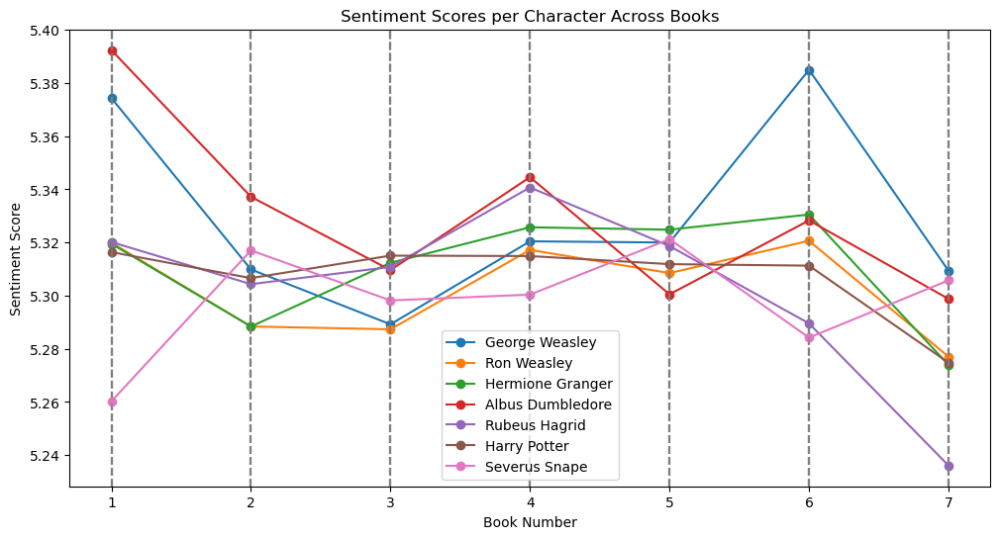

In [47]:
# Plot the sentiment of central characters across books
plt.figure(figsize=(12, 6))

# Iterate over each character's data and plot a line
for character_data in all_characters_sentiments:
    for name, sentiments in character_data.items():
        books = list(range(1, 8))
        plt.plot(books, sentiments, label=name, marker='o')

        # Adding vertical lines for clarity
        for x in books:
            plt.axvline(x, color='gray', linestyle='--', alpha=0.5)

# Add a legend
plt.legend()

# Add titles and labels
plt.title('Sentiment Scores per Character Across Books')
plt.xlabel('Book Number')
plt.ylabel('Sentiment Score')

# Show the plot
plt.show()

The graph shows the sentiment scores for different characters from the Harry Potter universe anf how these scores change along the series. It seems like there is no notable change on everyone's feelings from book to book because all the scores are close together in a tight range between 5.35 and 5.65. This may happen due to the nature of the books - a book contains a lot of descriptive text with no real sentiment value. To get a clearer picture of each character's emotions, we could look just at the dialogs, since that's when they show their true feelings. Or, we could use a better way to measure sentiment that also takes in to consideration the context and tone, not just the individual words.

-------------------------------------

# 6. Communities

In this section, we tried to discover relationships and interactions among characters through network representations, with a focus on community detection utilizing the Louvain algorithm. Each book's narrative unfolds a unique web of connections, allowing for a comprehensive examination of the dynamics within the wizarding world. We aim to unravel the mysteries of character affiliations, houses, and blood statuses. Let's cast some data spells and explore the enchanted communities within these networks.

## Louvain-algorithm

The algorithm uncovers meaningful communities, unraveling the nuanced social structures underlying J.K. Rowling's magical realm. This exploration sheds light on how characters form connections and affiliations, enhancing our understanding of the rich storytelling in the Harry Potter universe.

In [49]:
def compute_draw_partition(G, index):
    print('Book', index)
    
    # Keep only the largest connected component
    largest_cc = max(nx.connected_components(G), key=len)
    G = G.subgraph(largest_cc).copy()
    print(G)

    # Compute the best partition for the graph
    partition = community_louvain.best_partition(G)
    num_communities = len(set(partition.values()))
    print("Number of detected communities:", num_communities)

    # Print nodes in each community
    for comm in range(num_communities):
        print(f"Community {comm}: ", [node for node in partition if partition[node] == comm])

    # Calculate the modularity for the detected communities
    modularity = community_louvain.modularity(partition, G)
    print("Modularity of partition:", modularity)

    # Call the drawing function
    draw_graph(G, partition, index)
    return partition

In [50]:
def draw_graph(G, partition, index):
    # Kamada-Kawai layout for node positions
    pos = nx.kamada_kawai_layout(G)

    # Color mapping of communities
    cmap = plt.get_cmap('viridis')
    colors = [cmap(i, alpha=0.7) for i in np.linspace(0, 1, len(set(partition.values())))]

    # Draw nodes
    plt.figure(figsize=(12, 8))  # Set the size of the plot
    for i, comm in enumerate(set(partition.values())):
        list_nodes = [nodes for nodes in partition.keys() if partition[nodes] == comm]
        nx.draw_networkx_nodes(G, pos, list_nodes, node_size=50, node_color=colors[i])

    # Draw edges
    nx.draw_networkx_edges(G, pos, alpha=0.5, edge_color='grey')

    # Draw labels
    nx.draw_networkx_labels(G, pos, font_size=8)

    plt.title(f'Network Visualization of Book {index}')
    plt.show()

Book 1
Graph with 93 nodes and 348 edges
Number of detected communities: 7
Community 0:  ['Hedwig', 'Rubeus Hagrid', 'Vernon Dursley', 'Dennis', 'Dudley Dursley', 'Gordon', 'Malcolm', 'Lily Potter', 'Petunia Dursley', 'Piers Polkiss', 'Griphook', 'James Potter', 'Marge Dursley', 'Vindictus Viridian', 'Yvonne']
Community 1:  ['Adalbert Waffling', 'Emeric Switch', 'Harry Potter', 'Miranda Goshawk', 'Quentin Trimble', 'Arabella Figg', 'Snowy', 'Tufty', 'Cuthbert Binns', 'Dedalus Diggle', 'Doris Crockford', 'Fat Friar', 'Justin Finch-Fletchley', 'Lavender Brown', 'Mandy Brocklehurst', 'Rolanda Hooch', 'Terence Higgs']
Community 2:  ['Draco Malfoy', 'Filius Flitwick', 'Fluffy', 'Hermione Granger', 'Minerva McGonagall', 'Neville Longbottom', 'Nicolas Flamel', 'Perenelle Flamel', 'Poppy Pomfrey', 'Severus Snape', 'Argus Filch', 'Fang', 'Gregory Goyle', 'Morag MacDougal', 'Parvati Patil', 'Vincent Crabbe', 'Fat Lady', 'Pomona Sprout', 'Quirinus Quirrell', 'Garrick Ollivander', 'Irma Pince', 'L

/Users/itselios/anaconda3/lib/python3.11/site-packages/networkx/drawing/layout.py:726: RuntimeWarning: divide by zero encountered in divide
  costargs = (np, 1 / (dist_mtx + np.eye(dist_mtx.shape[0]) * 1e-3), meanwt, dim)
/Users/itselios/anaconda3/lib/python3.11/site-packages/networkx/drawing/nx_pylab.py:433: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  node_collection = ax.scatter(


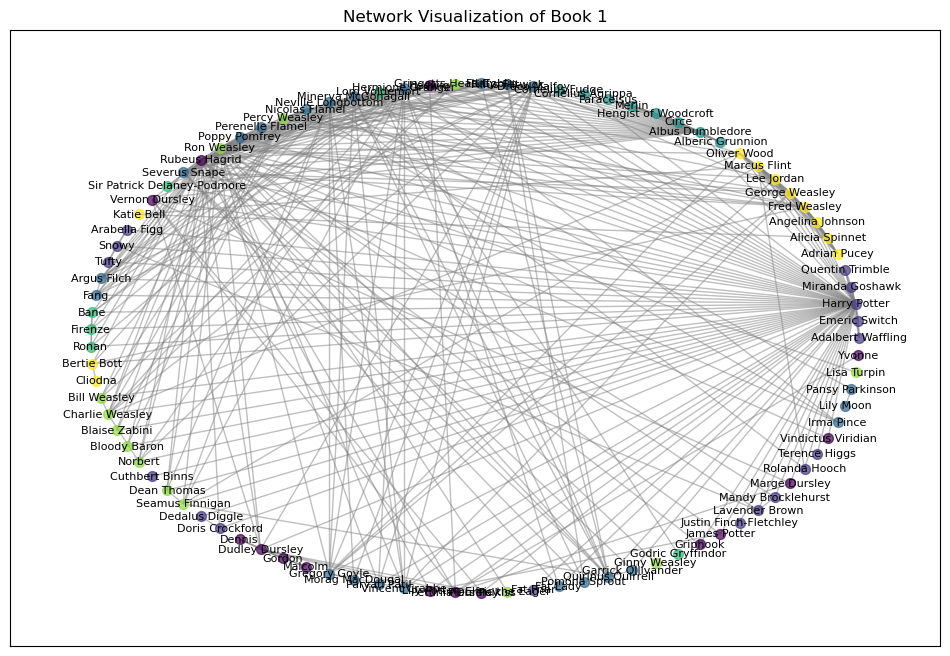

Book 2
Graph with 75 nodes and 341 edges
Number of detected communities: 7
Community 0:  ['Adrian Pucey', 'Harry Potter', 'Nearly-Headless Nick', 'Bloody Baron', 'Hannah Abbott', 'Ernie Macmillan', 'Millicent Bulstrode', 'Serpent of Slytherin', 'Veronica Smethley']
Community 1:  ['George Weasley', 'Alicia Spinnet', 'Angelina Johnson', 'Fred Weasley', 'Katie Bell', 'Marcus Flint', 'Oliver Wood', 'Arthur Weasley', 'Molly Weasley', 'Bill Weasley', 'Charlie Weasley', 'Percy Weasley', 'Hermes', 'Lee Jordan', 'Rolanda Hooch']
Community 2:  ['Albus Dumbledore', 'Argus Filch', 'Cuthbert Binns', 'Draco Malfoy', 'Gilderoy Lockhart', 'Justin Finch-Fletchley', 'Minerva McGonagall', 'Poppy Pomfrey', 'Severus Snape', 'Neville Longbottom', 'Sir Patrick Delaney-Podmore', 'Aurora Sinistra', 'Filius Flitwick', 'Parvati Patil', 'Seamus Finnigan', 'Dean Thomas', 'Lavender Brown', 'Irma Pince', 'Terry Boot']
Community 3:  ['Colin Creevey', 'Dobby', 'Gregory Goyle', 'Hermione Granger', 'Lucius Malfoy', 'Ron

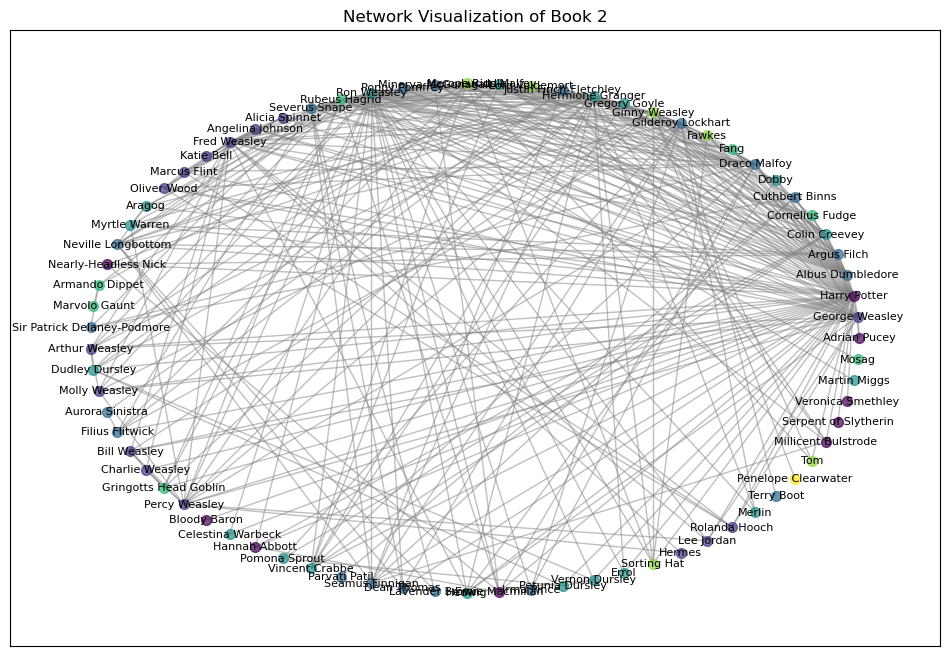

Book 3
Graph with 87 nodes and 420 edges
Number of detected communities: 5
Community 0:  ['Lucius Malfoy', 'Gregory Goyle', 'Vincent Crabbe', 'Pansy Parkinson']
Community 1:  ['Albus Dumbledore', 'Argus Filch', 'Buckbeak', 'Cornelius Fudge', 'Draco Malfoy', 'Fat Lady', 'Filius Flitwick', 'James Potter', 'Lord Voldemort', 'Minerva McGonagall', 'Peter Pettigrew', 'Pomona Sprout', 'Poppy Pomfrey', 'Rosmerta', 'Rubeus Hagrid', 'Severus Snape', 'Silvanus Kettleburn', 'Sirius Black', 'Walden Macnair', 'Fat Friar', 'Sir Patrick Delaney-Podmore', 'Hannah Abbott', 'Lily Potter', 'Merlin', 'Norbert', 'Trevor']
Community 2:  ['Fred Weasley', 'Alicia Spinnet', 'Angelina Johnson', 'Cassius Warrington', 'Cedric Diggory', 'George Weasley', 'Katie Bell', 'Lee Jordan', 'Lucian Bole', 'Oliver Wood', 'Rolanda Hooch', 'Graham Montague', 'Cho Chang', 'Marcus Flint', 'Peregrine Derrick', 'Roger Davies']
Community 3:  ['Harry Potter', 'Arthur Weasley', 'Bill Weasley', 'Cassandra Vablatsky', 'Colin Creevey', 

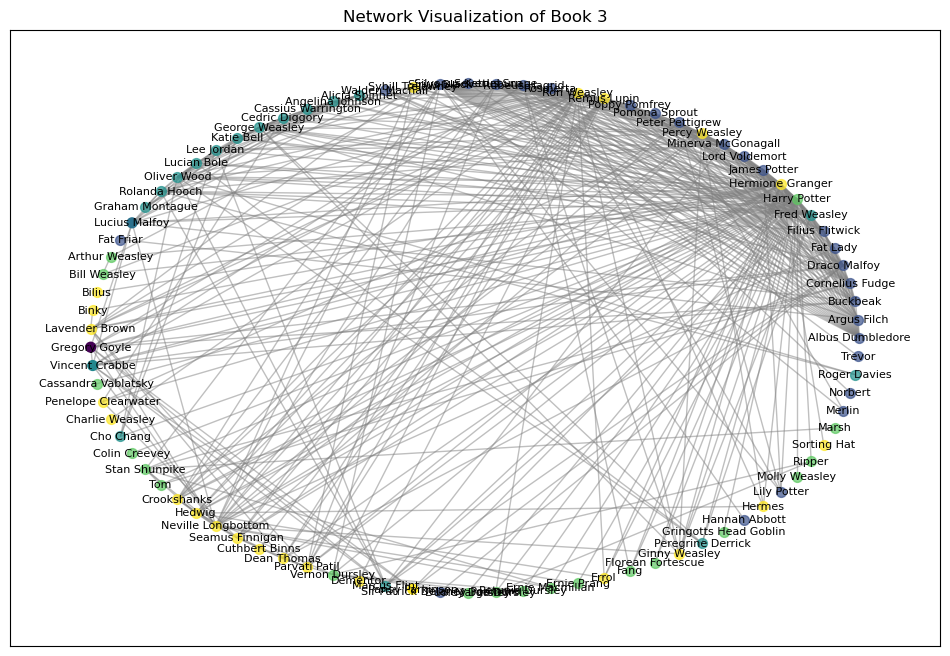

Book 4
Graph with 141 nodes and 718 edges
Number of detected communities: 7
Community 0:  ['Ludo Bagman', 'Aidan Lynch', 'Connolly', 'Moran', 'Rosmerta', 'Alexei Levski', 'Clara Ivanova', 'Ivan Volkov', 'Quigley', 'Troy', 'Vasily Dimitrov', 'Barry Ryan', 'Pyotr Vulchanov', 'Bozo', 'Hassan Mostafa', 'Lev Zograf', 'Mullet', 'Sir Patrick Delaney-Podmore']
Community 1:  ['Aberforth Dumbledore', 'Alastor Moody', 'Fang', 'Igor Karkaroff', 'Minerva McGonagall', 'Severus Snape', 'Argus Filch', 'Aurora Sinistra', 'Barty Crouch Snr', 'Cornelius Fudge', 'Draco Malfoy', 'Frank Bryce', 'Gregory Goyle', 'Hope Lupin', 'Lord Voldemort', 'Merlin', 'Vincent Crabbe', 'Lucius Malfoy', 'Augustus Rookwood', 'Avery', 'Mark Evans', 'Buckbeak', 'Dot', 'Malcolm', 'Malcolm Baddock', 'Evan Rosier', 'Wilkes', 'Nagini', 'Theodore Nott', 'Poliakoff', 'Peter Pettigrew', 'S. Fawcett', 'Summers']
Community 2:  ['Hermione Granger', 'Ron Weasley', 'Filius Flitwick', 'Neville Longbottom', 'Parvati Patil', 'Sirius Black', 

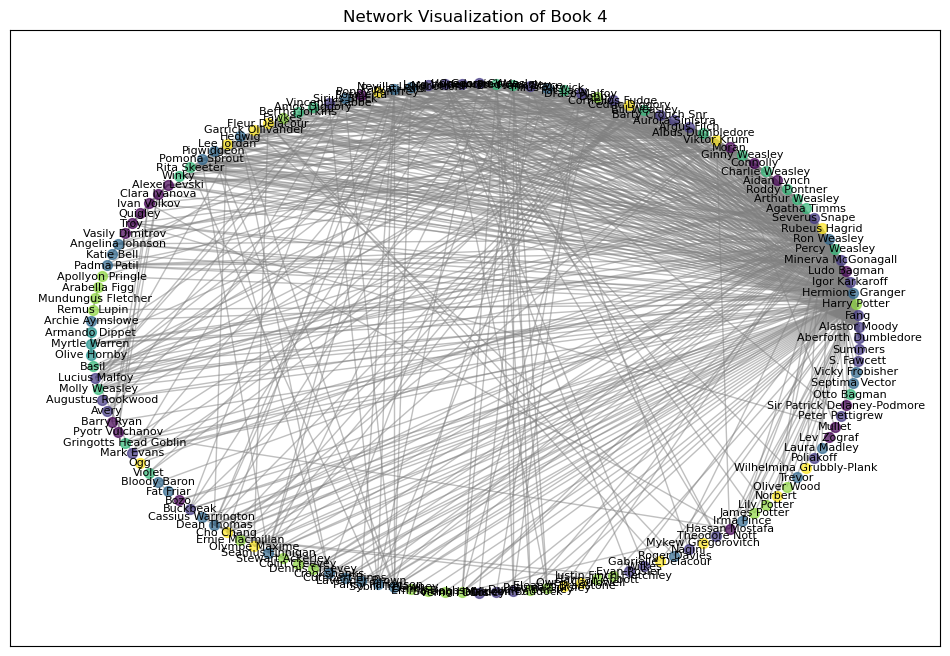

Book 5
Graph with 190 nodes and 1291 edges
Number of detected communities: 5
Community 0:  ['Aberforth Dumbledore', 'Alastor Moody', 'Albus Dumbledore', 'Andromeda Tonks', 'Cornelius Fudge', 'Dorcas Meadowes', 'Draco Malfoy', 'Remus Lupin', 'Rose Zeller', 'Sirius Black', 'Arthur Weasley', 'Benjy Fenwick', 'Dedalus Diggle', 'Hestia Jones', 'Kingsley Shacklebolt', 'Molly Weasley', 'Mundungus Fletcher', 'Vernon Dursley', 'Arabella Figg', 'Bill Weasley', 'Dudley Dursley', 'Florean Fortescue', 'James Potter', 'John Dawlish', 'Kreacher', 'Ludo Bagman', 'Marlene McKinnon', 'Merlin', 'Nymphadora Tonks', 'Percy Weasley', 'Petunia Dursley', 'Phineas Nigellus Black', 'Severus Snape', 'Willy Widdershins', 'Augustus Pye', 'Bob', 'Emmeline Vance', 'Gringotts Head Goblin', 'Ragnok', 'Williamson', 'Doris Purkiss', 'Marge Dursley', 'Mark Evans', 'Gilderoy Lockhart', 'Janus Thickey', 'Lily Potter', 'Sir Patrick Delaney-Podmore', 'Will']
Community 1:  ['Cedric Diggory', 'Hermione Granger', 'Ron Weasley',

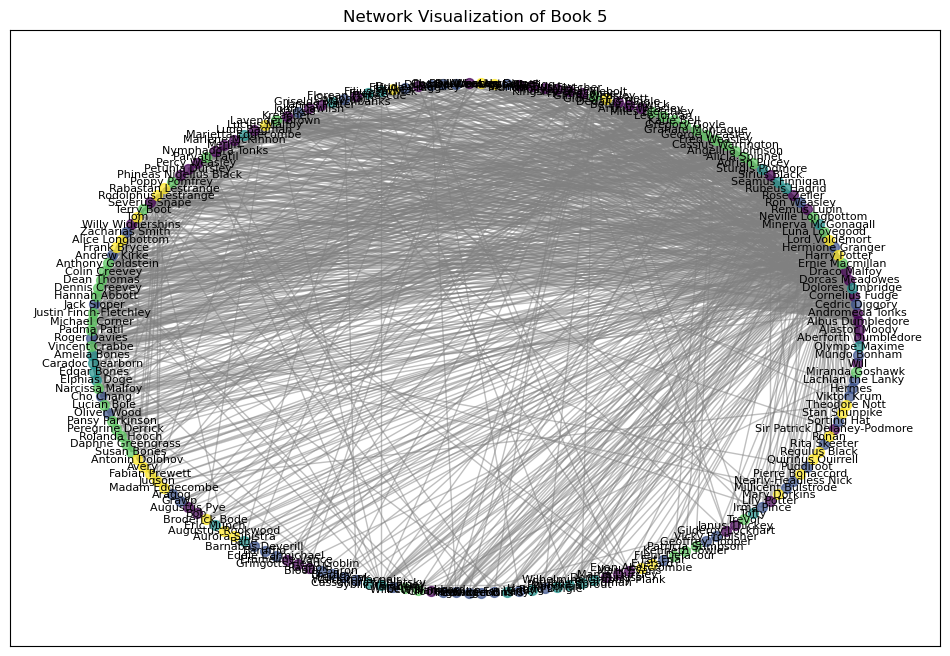

Book 6
Graph with 164 nodes and 826 edges
Number of detected communities: 7
Community 0:  ['Abraxas Malfoy', 'Ginny Weasley', 'Ron Weasley', 'Amycus Carrow', 'Cormac McLaggen', 'Hedwig', 'Katie Bell', 'Madam Edgecombe', 'Seamus Finnigan', 'Arnold Peasegood', 'Crookshanks', 'Pigwidgeon', 'Gabrielle Delacour', 'Garrick Ollivander', 'Melinda Bobbin', 'Cho Chang', 'Colin Creevey', 'Grawp', 'Gwenog Jones', 'Lavender Brown', 'Leanne', 'Dean Thomas', 'Demelza Robins', 'Ernie Macmillan', 'Romilda Vane', 'Fat Lady', 'Viktor Krum', 'Michael Corner']
Community 1:  ['Blaise Zabini', 'Severus Snape', 'Argus Filch', 'Bellatrix Lestrange', 'Draco Malfoy', 'Fang', 'Fenrir Greyback', 'Hermione Granger', 'Kreacher', 'Lucius Malfoy', 'Pomona Sprout', 'Rosmerta', 'Alecto Carrow', 'Aragog', 'Wilhelmina Grubbly-Plank', 'Irma Pince', 'Vincent Crabbe', 'Avery', 'Corban Yaxley', 'Narcissa Malfoy', 'Barnabas Deverill', 'Gregory Goyle', 'Pansy Parkinson', 'Dobby', 'Myrtle Warren', 'Theodore Nott', 'Septima Vecto

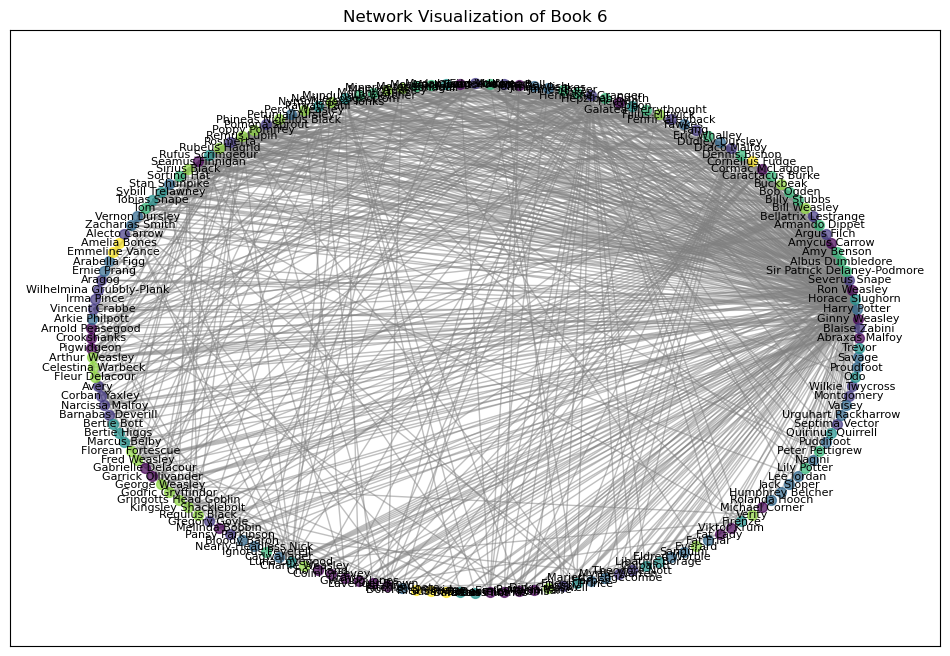

Book 7
Graph with 169 nodes and 955 edges
Number of detected communities: 8
Community 0:  ['Antonin Dolohov', 'Filius Flitwick', 'Lord Voldemort', 'Severus Snape', 'Sirius Black', 'Phineas Nigellus Black', 'Rubeus Hagrid', 'Sorting Hat', 'Alfred Cattermole', 'Corban Yaxley', 'Ellie Cattermole', 'Maisie Cattermole', 'Lee Jordan', 'Walden Macnair', 'Arkie Alderton', 'Dolores Umbridge', 'Charity Burbage', 'John Dawlish', 'Hannah Abbott', 'Kreacher', 'Nagini', 'Regulus Black']
Community 1:  ['Aberforth Dumbledore', 'Albus Dumbledore', 'Ariana Dumbledore', 'Bathilda Bagshot', 'Elphias Doge', 'Enid Smeek', 'Gellert Grindelwald', 'Godric Gryffindor', 'Ivor Dillonsby', 'Kendra Dumbledore', 'Muriel', 'Percival Dumbledore', 'Rita Skeeter', 'Adalbert Waffling', 'Nicolas Flamel', 'Armando Dippet', 'Betty Braithwaite', 'Fawkes', 'Hugo Weasley', 'James Potter', 'Lily Potter', 'Quirinus Quirrell', 'Rose Zeller', 'Sybill Trelawney', 'Viktor Krum', 'Lancelot', 'Bowman Wright', 'Mykew Gregorovitch', 'Pe

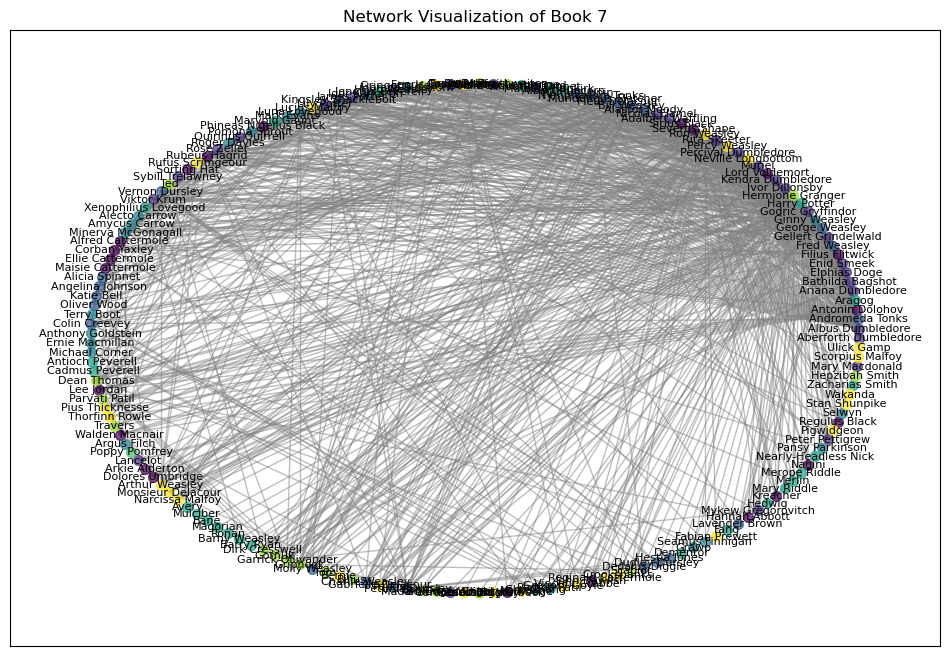

In [234]:
# For each graph compute the partition and modularity, visualize the communities
list_of_com = []
for i, graph in enumerate(graphs):
    list_of_com.append(compute_draw_partition(graph, i + 1))

Here we present a visual representation of the communites. Leveraging the power of the NetworkX library, this Python function enables the visualization of character interactions. By utilizing the Kamada-Kawai layout algorithm, nodes in the network are strategically positioned, providing an intuitive representation of the relationships between characters. The distinct communities within the graph are color-coded, allowing for a clear identification of social clusters.

In [52]:
# Function to reorganize the data into the required format
def reorganize_data(character_to_community):
    community_to_characters = {}
    for character, community in character_to_community.items():
        if community not in community_to_characters:
            community_to_characters[community] = []
        community_to_characters[community].append(character)
    organized_data = {"Book": [community for community in community_to_characters.values()]}
    return organized_data


In [53]:
def calculate_affiliation_percentages(communities, characters_data):
    affiliation_results = {}
    
    for book, communities in communities.items():
        book_results = []
        
        for community in communities:
            if not community:
                continue
            
            affiliations = characters_data[characters_data['name'].isin(community)][['da', 'oof', 'de']].notna().sum() * 100 / len(community)
            
            unknown_percent = 100 - affiliations.sum()

            book_results.append({
                "Community": community,
                "DA_Percentage": affiliations['da'],
                "OoP_Percentage": affiliations['oof'],
                "DE_Percentage": affiliations['de'],
                "Unknown_Percentage": unknown_percent
            })
        
        affiliation_results[book] = book_results
    
    return affiliation_results


In [54]:
# Function to calculate percentages for various attributes
def calculate_percentages(attribute, communities, characters_data):
    results = {}
    for book, communities in communities.items():
        book_results = []
        for community in communities:
            community_size = len(community)
            if community_size == 0:
                continue
            attribute_values = characters_data[characters_data['name'].isin(community)][attribute].value_counts(normalize=True) * 100
            book_results.append({
                "Community": community,
                "Attribute_Percentages": attribute_values
            })
        results[book] = book_results
    return results


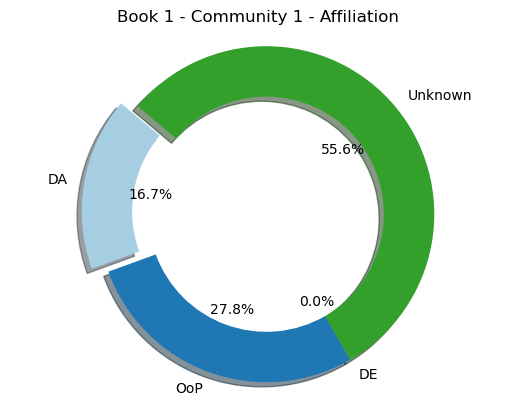

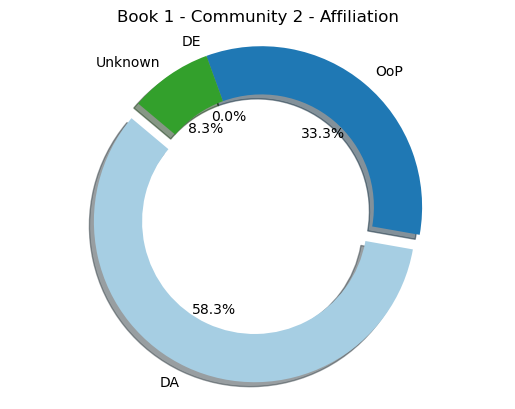

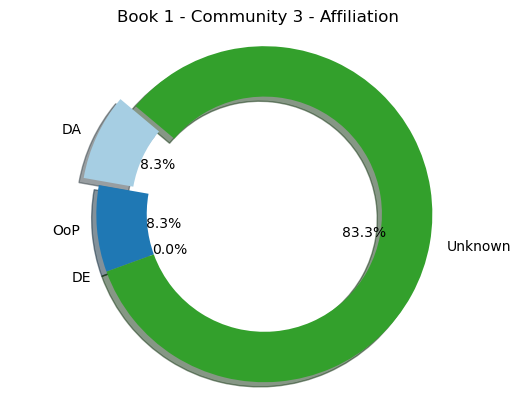

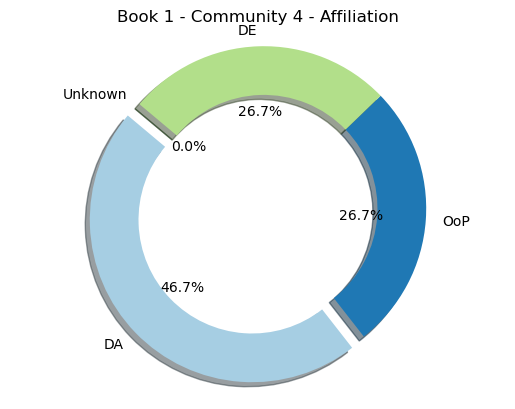

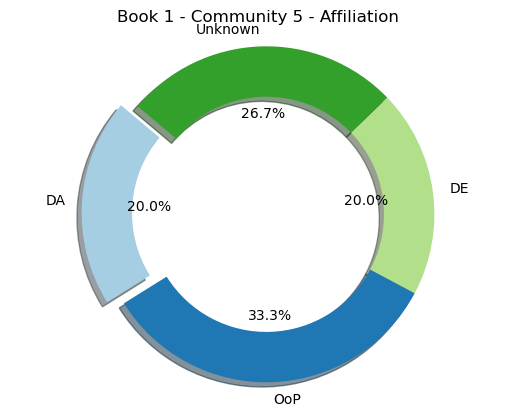

...

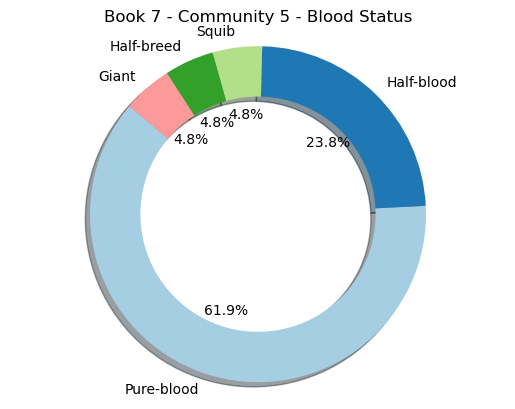

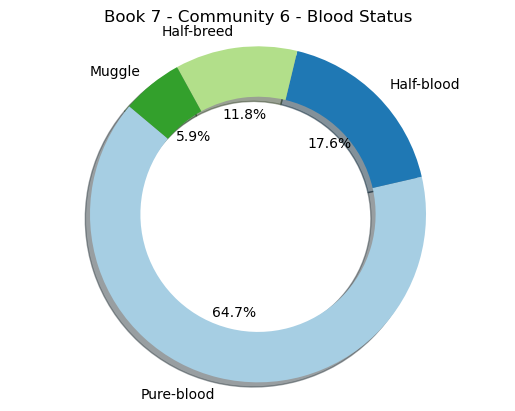

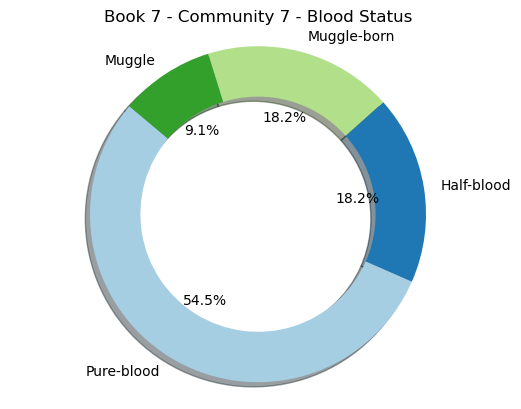

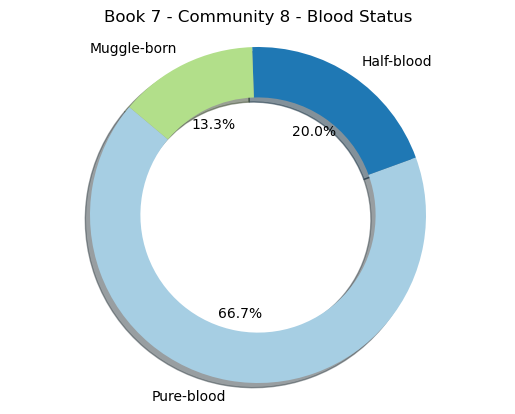

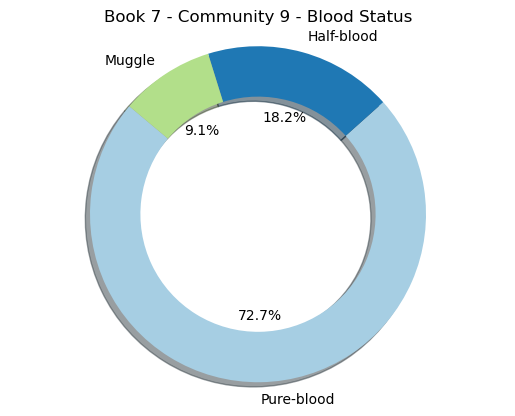

In [243]:
import matplotlib.pyplot as plt
import numpy as np

for book_index, com in enumerate(list_of_com):
    # Reorganize the data
    organized_communities = reorganize_data(com)
    
    # Calculate the affiliation percentages
    affiliation_percentages = calculate_affiliation_percentages(organized_communities, characters_df)
    
    for book, results in affiliation_percentages.items():
        for community_index, community_result in enumerate(results, start=1):
            # Calculate sizes with negative values set to zero
            sizes = [max(0, community_result['DA_Percentage']), max(0, community_result['OoP_Percentage']),
                     max(0, community_result['DE_Percentage']), max(0, community_result['Unknown_Percentage'])]

            # Define labels, colors, and explode
            labels = ['DA', 'OoP', 'DE', 'Unknown']
            colors = plt.cm.Paired.colors[:len(labels)]  # Change the color map
            explode = (0.1, 0, 0, 0)  # Explode the 1st slice (DA)

            # Create a pie chart with a custom background color
            fig, ax = plt.subplots()
            ax.set_facecolor('#F5F5F5')  # Light grey background
            plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140, wedgeprops=dict(width=0.3))

            plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
            plt.title(f"Book {book_index + 1} - Community {community_index} - Affiliation")

            # Save or display the pie chart
            file_name = f"book_{book_index + 1}_community_{community_index}_affiliation_pie.png"
            plt.savefig(file_name, bbox_inches='tight', facecolor=fig.get_facecolor())
            plt.show()

        # Calculate and plot percentages for house
        house_percentages = calculate_percentages('house', organized_communities, characters_df)
        
        for community_index, house_result in enumerate(house_percentages[book], start=1):
            sizes = house_result['Attribute_Percentages'].values
            labels = house_result['Attribute_Percentages'].index
            colors = plt.cm.Paired.colors[:len(labels)]

            # Create a pie chart with a custom background color
            fig, ax = plt.subplots()
            ax.set_facecolor('#F5F5F5')  # Light grey background
            plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140, wedgeprops=dict(width=0.3))

            plt.axis('equal')
            plt.title(f"Book {book_index + 1} - Community {community_index} - House")

            file_name = f"book_{book_index + 1}_community_{community_index}_house_pie.png"
            plt.savefig(file_name, bbox_inches='tight', facecolor=fig.get_facecolor())
            plt.show()

        # Calculate and plot percentages for blood_status
        blood_status_percentages = calculate_percentages('blood_status', organized_communities, characters_df)
        
        for community_index, blood_status_result in enumerate(blood_status_percentages[book], start=1):
            sizes = blood_status_result['Attribute_Percentages'].values
            labels = blood_status_result['Attribute_Percentages'].index
            colors = plt.cm.Paired.colors[:len(labels)]

            # Create a pie chart with a custom background color
            fig, ax = plt.subplots()
            ax.set_facecolor('#F5F5F5')  # Light grey background
            plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140, wedgeprops=dict(width=0.3))

            plt.axis('equal')
            plt.title(f"Book {book_index + 1} - Community {community_index} - Blood Status")

            file_name = f"book_{book_index + 1}_community_{community_index}_blood_status_pie.png"
            plt.savefig(file_name, bbox_inches='tight', facecolor=fig.get_facecolor())
            plt.show()


Within the visual exploration of each community, a trilogy of pie charts unveils key insights into the intricate social fabric of the Harry Potter universe. The first pie chart give information on the affiliations of characters within the community, portraying the percentages of characters aligned with distinct factions such as the Death Eaters, Order of the Phoenix, and others. The second pie chart gives data on the distribution of houses within the community, offering a snapshot of the percentage representation of Gryffindor, Slytherin, Hufflepuff, and Ravenclaw. Finally, the third pie chart unravels the composition of blood statuses, showcasing the proportions of characters classified as gaint, half-blood, half-breed, muggle, muggle-born, pure-blood, squib, and those with unknown blood statuses.

- In Book 1 
    - Community 2:
        - This community revolves around characters associated with Quidditch and related events.
        - All characters in this community are either Quidditch players or have a direct association with the sport
        - Most of the characters are in the Dambledor's army with 58,3%, the majority of the characters are from Gryffindor with 77,8% and all of them are pure-blood as we expected
- In Book 3 
    - Community 0:
        - There are characters represent various Hogwarts staff members, including professors, caretakers, and magical creatures' caretakers.
        - The inclusion of magical creatures suggests a theme related to creatures residing at or associated with Hogwarts.
        - The presence of Lord Voldemort and Sirius Black indicates the inclusion of significant wizarding figures with key roles in the overall narrative. Merlin, James Potter and Lily Potter a legendary wizard, adds a historical dimension.
        - Most of the character are not in any affiliation with 80%. The surprise is that everyone is from Gryffindor and everyone is pure blood as well.
        
In the initial three books, the community dynamics revolve around Hogwarts students, staff and general characters, aligning with the series' central focus. As expected, Death Eaters and Voldemort's associates are notably absent from these early communities, reflecting the narrative timeline. These insights offer a glimpse into the everyday interactions within Hogwarts. A delightful revelation unfolds as each book introduces a unique community dedicated to Quidditch players, emphasizing the significance of the magical sport. 

- In Book 4 
    - Community 5:
        - There are characters are known Death Eaters or individuals associated with dark magic. Their allegiance to Lord Voldemort suggests a shared theme of serving the dark forces.
        - This community includes significant characters directly connected to Voldemort. Nagini, Voldemort's snake and Horcrux, and Peter Pettigrew, who played a crucial role in Voldemort's return, further emphasize the close ties within Voldemort's inner circle.
        - The presence of characters associated with Voldemort's return, his followers, and those affected by his actions creates a thematic link to the overarching Voldemort storyline. The legacy of Voldemort and the impact on the wizarding world are central themes within this community.
        - Noone is in Dumbledor's army or in Order of the Phoenix, and most of them are in Slytherin.
- In Book 5 
    - Community 0:
        - This community includes a diverse set of characters representing significant figures in the wizarding world. The theme centers around their roles in shaping events, alliances, and conflicts.
        - Characters associated with the Ministry of Magic are prominent in this community. The theme revolves around political dynamics, government roles, and the influence of the Ministry in the wizarding society.
        - The presence of known Death Eaters and followers of Lord Voldemort suggests a connection to dark forces and the overarching conflict between good and evil.
        - It is the biggest community, so we can not understand a lot of things from the piecharts.
        - This when the wizzarding world learns about the return of the Voldemord, so we can understand why there are a lot of big communities. More people equals more interactions

---------------------------------------------------------------------------------------------------------------------------

# 7. Word Clouds

In this section we created word clouds to show the most frequent words of each book that also are most unique for to that book compared to the whole series. 

A word cloud is a visual representation of text data, with word size indicating frequency/importance. However, this can sometimes highlight common words that are not very informative. We're combining word clouds with TF-IDF (Term Frequency-Inverse Document Frequency) to provide more informative representations, especially since we are working with multiple documents (7 books). A word that appears frequently in one book but rarely in others, will have a high TF-IDF score for that particular document/book because it will have a high TF in that specific document and a low document frequency across the corpus.  


We started by preprocessing the books (lowercasing, removing punctuation, eliminating stop words, POS tagging,filtering out verbs).

In [48]:
# Preprocessing the text of the books 
def preprocess_text(text):
    # Convert to lowercase
    text = text.lower()
    
    # Tokenize into sentences, then into words
    sentences = sent_tokenize(text)
    word_tokens = [word_tokenize(sentence) for sentence in sentences]

    # Remove punctuation and stop words
    stop_words = set(stopwords.words('english'))
    words_filtered = []

    for sentence in word_tokens:
        words_filtered.extend([word for word in sentence if word.isalpha() and word not in stop_words])

    # POS Tagging and filtering out verbs
    tagged_words = pos_tag(words_filtered)
    non_verbs = [word for word, tag in tagged_words if not tag.startswith('VB')]

    return ' '.join(non_verbs)

# 'processed_books' now holds the preprocessed books
processed_books = [preprocess_text(book) for book in books_list]

Then, we configured and applied a TF-IDF (Term Frequency-Inverse Document Frequency) vectorizer to the "processed_books".
For better results we set max_df = 0.9.

( *max_df: Ignore terms that have a document frequency strictly higher than the given threshold (corpus-specific stop words). If float in range [0.0, 1.0], the parameter represents a proportion of documents.* )


In [49]:
# Adjust the TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english', max_df = 0.9)
tfidf_matrix = vectorizer.fit_transform(processed_books)
feature_names = vectorizer.get_feature_names_out()

After that, we iterated over the books and extracted the TF-IDF scores for each word to create a dictionary (word_scores) that maps words to their respective TF-IDF scores. Then we generated a word cloud for each book from the frequencies provided in the word_scores dictionary and displayed the word clouds using matplotlib.

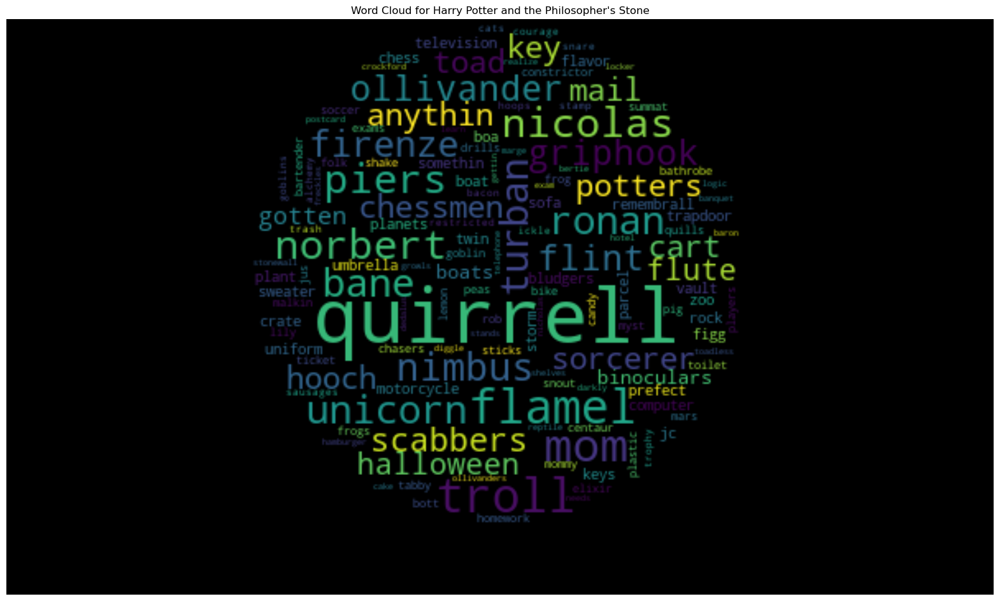

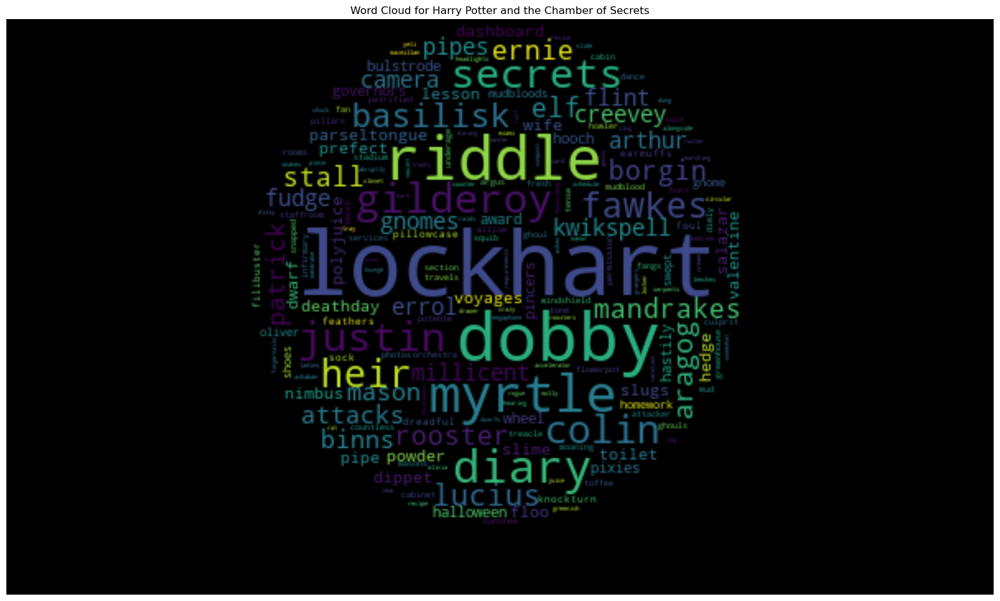

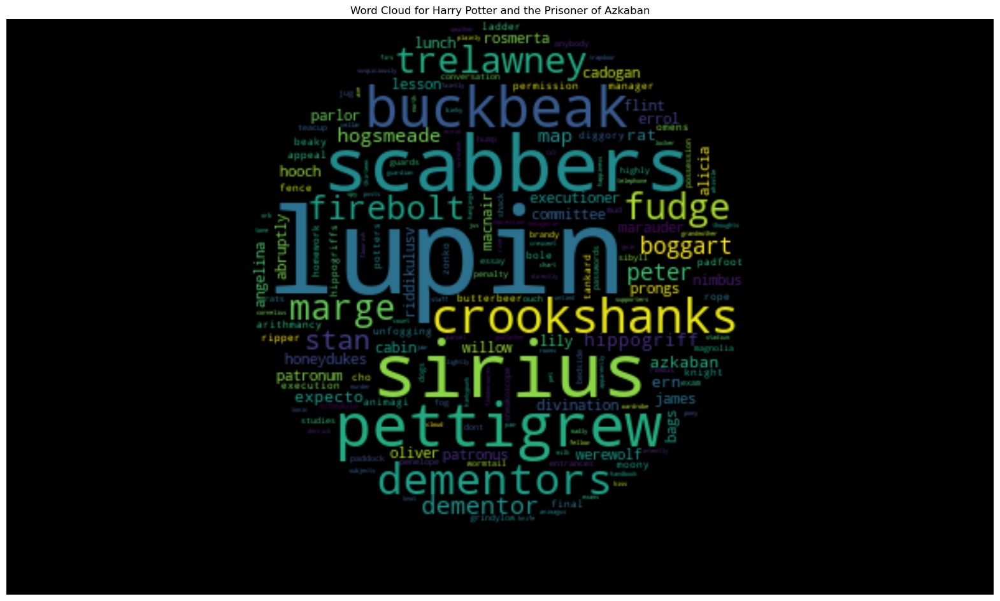

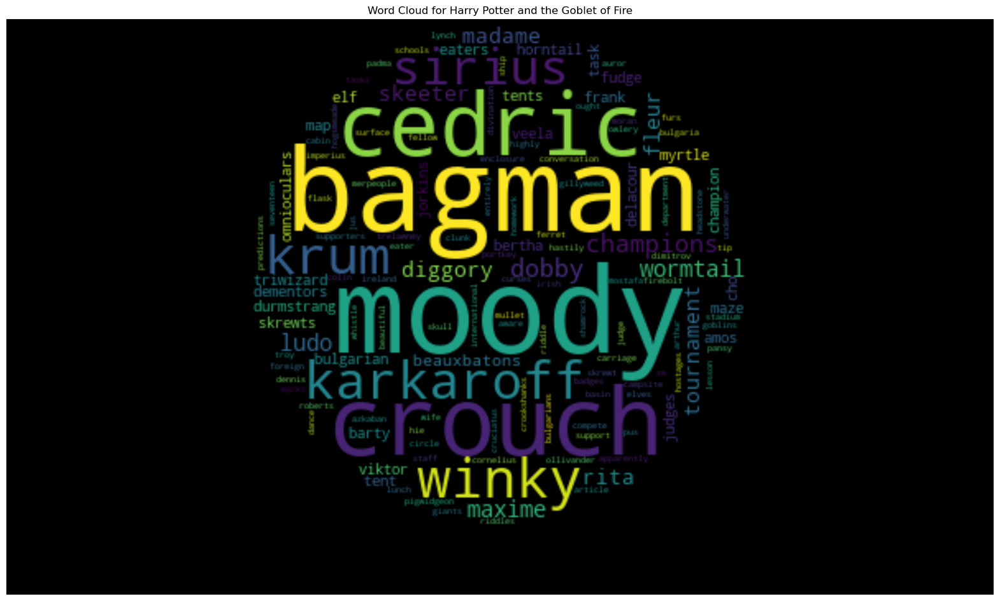

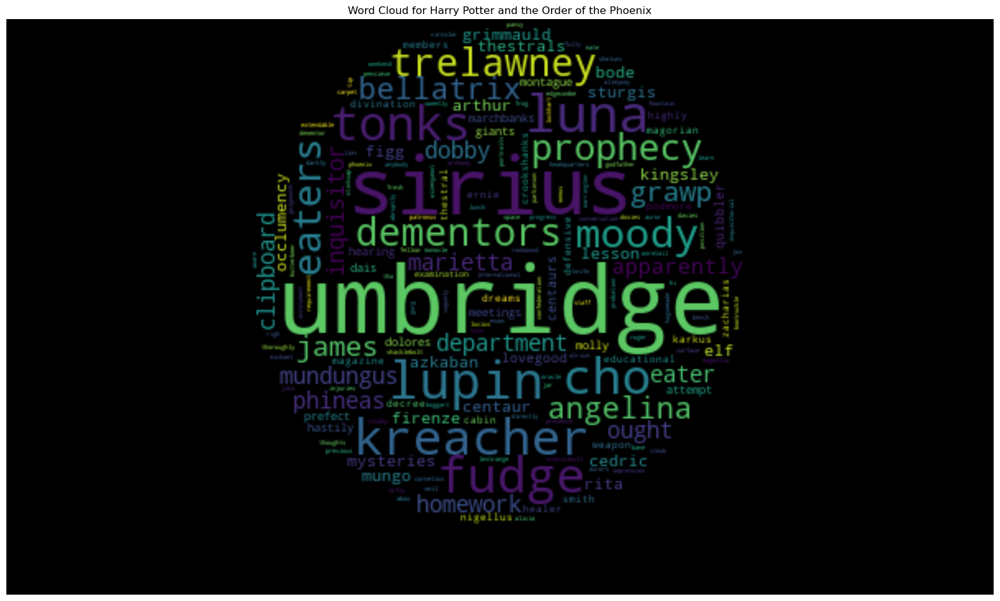

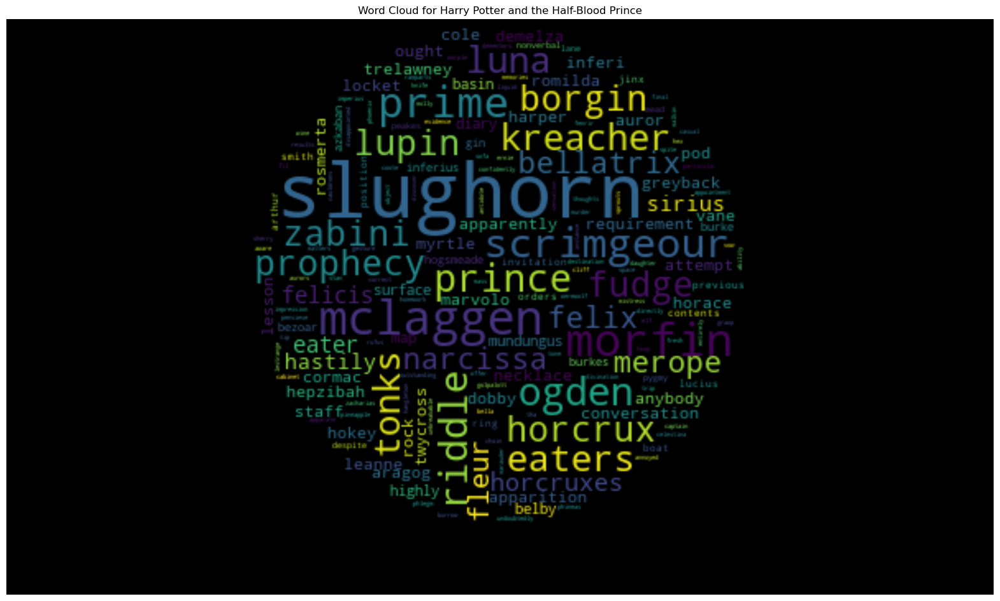

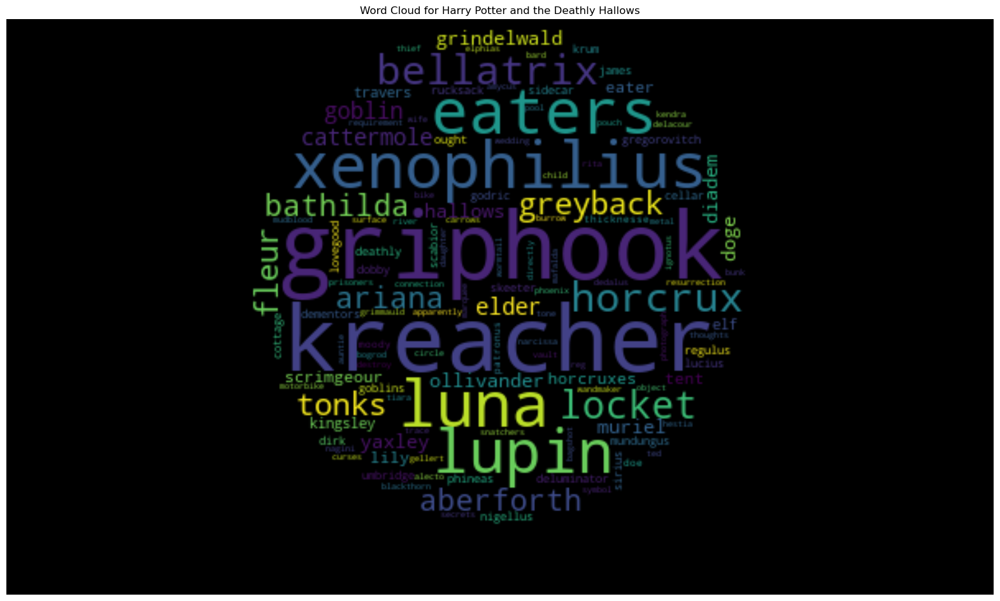

In [50]:
# Load the mask image
mask_image = np.array(Image.open("black.png"))

# Generate word clouds using TF-IDF scores
# for i, book in enumerate(processed_books):
for i, (book, title) in enumerate(zip(processed_books, book_short_titles)):
    # Summarize the TF-IDF scores for each word in this book
    tfidf_scores = zip(feature_names, tfidf_matrix[i].toarray()[0])
    
    # Create a dictionary with words and their TF-IDF scores
    word_scores = {word: score for word, score in tfidf_scores if score > 0}

    # Generate word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='black', mask=mask_image)
    wordcloud.generate_from_frequencies(word_scores)
    
    # Display the word cloud using matplotlib
    plt.figure(figsize=(20, 20))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Harry Potter and the {title}')
    plt.axis("off")

plt.show()

Some examples of words with big size/frequency/importance in each word cloud:

In the first word cloud from Philosopher’s Stone:
- Quirrell: Quirinus Quirrell, the defence against the dark arts teacher, who is hosting Voldemort's spirit
- Flamel: Nicolas Flame, the owner of the Philosopher's stone

In the second word cloud from Chamber of Secrets:
- Lockhart: Gilderoy Lockhart, the new Defence Against the Dark Arts teacher 
- Riddle: The family name of Voldemort
- Myrtle: Moaning Myrtle, a ghost and the only victim to die by looking straight into the basilisk's eyes 

In the third word cloud from Prisoner of Azkaban:
- Lupin: Remus Lupin, an old friend of James Potter and new Defence Against the Dark Arts teacher
- Pettigrew + Scabbers: Peter Pettigrew, an old friend of James Potter who betrays him to Voldemort (Ron’s rat Scabbers is his Animagus form)
- Sirius: Sirius Black, an old friend of James Potter, godfather of Harry and wrongly convicted for the murder of the Potters.

In the fourth word cloud from Goblet of Fire:
- Moody: Alastor “Mad-Eye” Moody, the new teacher in Defence Against the Dark Arts and retired auror
- Crouch: Barty Crouch Jr., he enters Harry's name in the Goblet and takes the identity of Alastor Moody. 

In the fifth word cloud from Order of the Phoenix:
- Umbridge: DoloresUmbridge, she was installed, by order of the Ministry, as the new teacher for Defence Against the Dark Arts
- Trelawney + Prophecy: Professor Sybill Trelawney made a prophecy about the future battle between Harry and Voldemort

In the sixth word cloud from Half-Blood Prince:
- Slughorn: Horace Slughorn, the new Potions professor, he had told Voldemort about Horcruxes
- Prince: Half-Blood Prince, the author of Harry’s potions book that urns out to be Snape

In the seventh word cloud from Deathly Hallows:
- Griphook: a goblin who works for Gringotts Wizarding Bank, and helps Harry, Ron and Hermione break into the bank
- Kreacher: led the house-elves of Hogwarts in the final battle against Lord Voldemort
- Xenophilius: Xenophilius Lovegood is Luna’s father, the one that tells the story of the Deathly Hallows to Harry, Ron and Hermione.

------------------------

# 8. Analyzing Spells

In this part of the project we wanted to analyze the use of spells in the books and see how that progresses with time.

A spell is a controlled manifestation of magic. Generally cast by a witch or a wizard, spells were often produced with an incantation, or for more experienced witches and wizards mentally, and could appear as jets of light. Below is a list of some known categories that spells could be assigned to.

- Charm: A charm can alterate an object's behaviour/capabilities or its form/appearance, it can inhibite the effect of another spell and improve the condition of a living, injured or ill target.

- Curse: A curse is the worst kind of dark magic which is intended to harm, control or even kill its target.

We started by scrapping a list of spells used in the Harry Potter universe and then we created a dataframe with each spell's Incantation, Type and Resulting Effect.

In [51]:
url = 'https://www.pojo.com/harry-potter-spell-list/'

# Perform the GET request to fetch the content of the URL
response = requests.get(url)

# Parse the HTML content
soup = BeautifulSoup(response.content, 'html.parser')

# Find the table
table = soup.find('table')

# Initialize a list to store the spells
data = []

# Iterate over each row in the table
for row in table.find_all('tr'):
    cols = row.find_all('td')
    if len(cols) == 3:  # Ensure that there are 3 columns in the row
        incantation = cols[0].text.strip()
        type_ = cols[1].text.strip()
        effect = cols[2].text.strip()
        data.append({'Incantation': incantation, 'Type': type_, 'Effect': effect})

# Create the dataframe
spells_df = pd.DataFrame(data)

After that, we cleaned the dataframe by removing rows with errors as well as spells specifically mentioned in video games, or the Trading Card Game based on their Type or their Incantation.

In [52]:
# Delete some rows based on the Type
indices_to_drop = spells_df[spells_df['Type'] == '—'].index
spells_df.drop(indices_to_drop, inplace=True)
indices_to_drop = spells_df[spells_df['Type'] == ''].index
spells_df.drop(indices_to_drop, inplace=True)
indices_to_drop = spells_df[spells_df['Type'] == 'Type'].index
spells_df.drop(indices_to_drop, inplace=True)
indices_to_drop = spells_df[spells_df['Type'] == 'Enchantment'].index
spells_df.drop(indices_to_drop, inplace=True)
indices_to_drop = spells_df[spells_df['Type'] == 'Hex'].index
spells_df.drop(indices_to_drop, inplace=True)
indices_to_drop = spells_df[spells_df['Type'] == 'Jinx'].index
spells_df.drop(indices_to_drop, inplace=True)

# Delete some rows based on the Incantation
indices_to_drop = spells_df[spells_df['Incantation'] == 'Cornflake Skin'].index
spells_df.drop(indices_to_drop, inplace=True)
indices_to_drop = spells_df[spells_df['Incantation'] == 'Ear Shriveling'].index
spells_df.drop(indices_to_drop, inplace=True)
indices_to_drop = spells_df[spells_df['Incantation'] == 'Entrail-Expelling'].index
spells_df.drop(indices_to_drop, inplace=True)
indices_to_drop = spells_df[spells_df['Incantation'] == 'Maledictus'].index
spells_df.drop(indices_to_drop, inplace=True)
indices_to_drop = spells_df[spells_df['Incantation'] == 'Apparate'].index
spells_df.drop(indices_to_drop, inplace=True)

# Delete some rows because they are used in the books as common words not spells
indices_to_drop = spells_df[spells_df['Incantation'] == 'Horcrux'].index
spells_df.drop(indices_to_drop, inplace=True)
indices_to_drop = spells_df[spells_df['Incantation'] == 'Pack'].index
spells_df.drop(indices_to_drop, inplace=True)
indices_to_drop = spells_df[spells_df['Incantation'] == 'Flying'].index
spells_df.drop(indices_to_drop, inplace=True)
indices_to_drop = spells_df[spells_df['Incantation'] == 'Finite'].index
spells_df.drop(indices_to_drop, inplace=True)
indices_to_drop = spells_df[spells_df['Incantation'] == 'Cheering'].index
spells_df.drop(indices_to_drop, inplace=True)
indices_to_drop = spells_df[spells_df['Incantation'] == 'Gripping'].index
spells_df.drop(indices_to_drop, inplace=True)

# Change some Incantation types into curses
spells_df.loc[spells_df['Incantation'] == 'Sectumsempra', 'Type'] = 'Curse'
spells_df.loc[spells_df['Incantation'] == 'Reducto', 'Type'] = 'Curse'
spells_df.loc[spells_df['Incantation'] == 'Expulso', 'Type'] = 'Curse'
spells_df.loc[spells_df['Incantation'] == 'Petrificus Totalus', 'Type'] = 'Curse'

# Changing all 'Spell' types to 'Charm' because spell is not a type
spells_df.loc[spells_df['Type'] == 'Spell', 'Type'] = 'Charm'

spells_df.reset_index(drop=True, inplace=True)
print(spells_df)

            Incantation   Type                            Effect
0                Aberto  Charm                     Opens objects
1                 Accio  Charm                 Summons an object
2             Aguamenti  Charm           Shoots water from wand.
3      Alarte Ascendare  Charm     Shoots things high in the air
4             Alohomora  Charm              Opens locked objects
..                  ...    ...                               ...
173   Verdimillious Duo  Charm  More powerful than Verdimillious
174     Vipera Evanesca  Charm               Makes Snakes Vanish
175    Vulnera Sanentur  Charm                     Heals victims
176           Waddiwasi  Charm                Unsticks an object
177  Wingardium Leviosa  Charm               Makes on object fly

[178 rows x 3 columns]


We counted the occurrences of each incantation in the text of each book in order to find the 10 most used spells.

In [53]:
# Function to count the occurrences of each incantation in the text of a book.
def count_incantations_in_book(book_text, incantations):
    # Make the book text lowercase to ensure matching is case-insensitive
    book_text = book_text.lower()
    # Count the occurrences of each incantation
    return {incantation: book_text.count(incantation.lower()) for incantation in incantations}

for i, book in enumerate(books_list):
    counts = count_incantations_in_book(book, spells_df['Incantation'])
    # Update the dataframe with the counts
    spells_df[f'Book {i+1}'] = spells_df['Incantation'].map(counts)

In [54]:
# Sums the counts across all book columns to get a total count for each incantation
spells_df['Total'] = spells_df.loc[:, 'Book 1':'Book 7'].sum(axis=1)

# Create csv
spells_df.to_csv('spells.csv')

# Sorts the dataframe by the 'Total' column in descending order
top_incantations = spells_df.nlargest(10, 'Total')[['Incantation', 'Total']]

print(top_incantations)

          Incantation  Total
1               Accio     34
61   Expecto Patronum     29
62       Expelliarmus     27
160           Stupefy     27
104             Lumos     22
13      Avada Kedavra     19
149        Riddikulus     18
36             Crucio     15
89            Imperio     15
134           Protego     13


Based on the results "Accio" is a charm that summons an object and it is the most invoked spell, appearing 34 times as it is extremely useful in a wizard's daily life. "Stupefy" and "Lumos" are also commonly used, demonstrating their practicality. In this Top-10 we also find "Expecto Patronum", "Expelliarmus" and "Protego" which are significant due to their defensive nature. "Avada Kedavra", "Crucio" and "Imperio" are the three Unforgivable Curses, they are the most powerful Dark spells and they were used throughout the series by Dark wizards/Deatheaters.

Then, in order to see if the number of curses cast increased as the books progressed and the plot darkened, we counted the number of curses in each book.

In [55]:
curse_counts_per_book = {}

# Iterate over each book column to sum the counts of 'Curse' type incantations.
for i in range(7):
    book_column = f'Book {i+1}'
    # Filter for 'Curse' type and sum the counts for that book.
    curse_counts_per_book[book_column] = spells_df[spells_df['Type'] == 'Curse'][book_column].sum()

for book, count in curse_counts_per_book.items():
    print(f'Curses in {book}: {count}')  

Curses in Book 1: 3
Curses in Book 2: 1
Curses in Book 3: 0
Curses in Book 4: 26
Curses in Book 5: 13
Curses in Book 6: 23
Curses in Book 7: 23


From the count of curses cast in each Harry Potter book, it appears that the number fluctuates, rather than showing a consistent increase. The first three books have a relatively low number of curses, with the third book having none at all. However, there's a significant jump in the fourth book, which coincides with the return of Voldemort. The fifth book shows a decrease from the fourth, but the number remains high. The sixth and seventh books maintain a high level of curse usage. One might expect the seventh book to have the most curses, as the Battle of Hogwarts takes place, but that doesn't happen. This could be due to the fact that the incantation of many spells is not written in the book every time they are cast, as well as the possibility that many experienced wizards can cast spells non-verbally.